



# Segmentation Benchmark

Run this notebook top to bottom. The default selection is a multi-seed comparison of the three selected `SneddySegUNet1D` configs.


## 1. Setup

Find the project root, choose the device, and load datasets.


In [1]:
from pathlib import Path
import sys


def find_project_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    for path in [start, *start.parents]:
        if (path / "data").exists() and (path / "neurosned").exists():
            return path
        nested = path / "neurosned"
        if (nested / "data").exists() and (nested / "neurosned").exists():
            return nested
    raise FileNotFoundError("Could not find neurosned project root.")


PROJECT_ROOT = find_project_root()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from ayana_revision.config import EXPERIMENTS, get_experiment, make_variant, sneddy_seg_unet_start_sweep, sneddy_seg_unet_final_candidates, sneddy_seg_unet_multiseed_candidates, sneddy_seg_unet_notebook_parity
from ayana_revision.data import choose_torch_device, load_segmentation_data
from ayana_revision.train import run_experiment

PREFER_CUDA = True
REQUIRE_CUDA_FOR_TRAINING = False

device = choose_torch_device(PREFER_CUDA, REQUIRE_CUDA_FOR_TRAINING)
data = load_segmentation_data(PROJECT_ROOT)
print(f"Default std on train: {data.default_rmse_train:.4f}, valid: {data.default_rmse_valid:.4f}, holdout: {data.default_rmse_test:.4f}")


Using CUDA device: NVIDIA GeForce RTX 5090


UnpicklingError: invalid load key, 'v'.

## 2. Available Model Experiments

These keys match model class names from `neurosned.models`.


In [2]:
list(EXPERIMENTS.keys())


['RecurrentSneddyUnet', 'SneddySegUNet1D']

## 3. Select Experiments

Default: notebook-parity `SneddySegUNet1D` run configured to match `notebooks/challenge_1/3_segmentation.ipynb` metrics as closely as possible.


In [3]:
#selected_experiments = [sneddy_seg_unet_notebook_parity()]

# Full notebook-like run instead of 10-epoch demonstration mode:
selected_experiments = [sneddy_seg_unet_notebook_parity(demonstration_mode=False)]

# Fine-tune notebook-like run instead:
# selected_experiments = [sneddy_seg_unet_notebook_parity(finetune_mode=True)]

# Benchmark multi-seed comparison instead:
# selected_experiments = sneddy_seg_unet_multiseed_candidates(seeds=(42, 43, 44))

# Two final candidate runs instead:
# selected_experiments = sneddy_seg_unet_final_candidates()

# Fast sweep instead:
# selected_experiments = sneddy_seg_unet_start_sweep()

# Single 120-epoch baseline/final run instead:
# selected_experiments = [get_experiment("SneddySegUNet1D")]

# Custom variants instead:
# selected_experiments = [
#     make_variant("SneddySegUNet1D", "SneddySegUNet1D_sig012_lr3e4", train_config={"sigma": 0.12, "initial_lr": 3e-4}),
#     make_variant("SneddySegUNet1D", "SneddySegUNet1D_tau075", train_config={"train_temperature": 0.75, "eval_temperature": 0.75}),
# ]

selected_experiments


[{'name': 'SneddySegUNet1D_notebook_parity_scratch_full',
  'model': 'SneddySegUNet1D',
  'model_config': {'n_chans': 128,
   'n_times': 200,
   'sfreq': 100,
   'c0': 96,
   'widen': 2,
   'depth_per_stage': 5,
   'dropout': 0.2,
   'k': 15,
   'out_channels': 1},
  'train_config': {'n_epochs': 100,
   'early_stopping_patience': 20,
   'use_augmentation': True,
   'initial_lr': 0.001,
   'weight_decay': 0,
   'optimizer': 'Adam',
   'batch_size': 2000,
   'eval_batch_size': 256,
   'sigma': 0.15,
   'cropping_offset': 0.25,
   'crop_proba': 0.3,
   'dropout_proba': 0.25,
   'dropout_range': 0.25,
   'mixup_p': 0.1,
   'temperature': 0.65,
   'train_temperature': 0.65,
   'eval_temperature': 0.65,
   'lambda_time': 3.0,
   'lambda_ce': 1.0,
   'train_lambda_ce': 1.0,
   'lambda_wass': 0.0,
   'lambda_kl': 0.0,
   'lambda_entropy': 0.0,
   'lambda_focal': 0.0,
   'grad_accum': 1,
   'save_epoch_plots': True,
   'show_val_epoch_plots': True,
   'run_holdout_test': False,
   'plateau_acti

## 4. Check The Run List

A compact view of what will run before starting training.


In [4]:
[
    {
        "group": exp.get("group", exp["name"]),
        "name": exp["name"],
        "model": exp["model"],
        "epochs": exp["train_config"]["n_epochs"],
        "patience": exp["train_config"]["early_stopping_patience"],
        "sigma": exp["train_config"]["sigma"],
        "lr": exp["train_config"]["initial_lr"],
        "batch_size": exp["train_config"]["batch_size"],
        "lambda_time": exp["train_config"]["lambda_time"],
        "lambda_ce": exp["train_config"]["lambda_ce"],
        "train_lambda_ce": exp["train_config"].get("train_lambda_ce", exp["train_config"]["lambda_ce"]),
        "train_temperature": exp["train_config"].get("train_temperature", exp["train_config"]["temperature"]),
        "eval_temperature": exp["train_config"].get("eval_temperature", exp["train_config"]["temperature"]),
        "holdout": exp["train_config"].get("run_holdout_test", True),
        "plateau_action": exp["train_config"].get("plateau_action", "stop"),
        "input_checkpoint": exp["train_config"].get("input_checkpoint_path"),
        "seed": exp["train_config"].get("seed"),
    }
    for exp in selected_experiments
]


[{'group': 'SneddySegUNet1D_notebook_parity_scratch_full',
  'name': 'SneddySegUNet1D_notebook_parity_scratch_full',
  'model': 'SneddySegUNet1D',
  'epochs': 100,
  'patience': 20,
  'sigma': 0.15,
  'lr': 0.001,
  'batch_size': 2000,
  'lambda_time': 3.0,
  'lambda_ce': 1.0,
  'train_lambda_ce': 1.0,
  'train_temperature': 0.65,
  'eval_temperature': 0.65,
  'holdout': False,
  'plateau_action': 'halve_lr_reload_best',
  'input_checkpoint': 'artefacts/models/challenge_1/unet_deeper.pth',
  'seed': 42}]

## 5. Run Training

This cell writes each run to `neurosned/artifacts/` and updates `benchmark_summary.*`.


Initial checkpoint not found, starting from scratch: /home/qdata/ayana_experiments/neurosned/artefacts/models/challenge_1/unet_deeper.pth
Artifacts for this run: /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640
Epoch 1/100: 

Epoch 1 [38/38] Loss 6.1767 CE 5.0205 RMSE 0.3854 KL 0.0000 WASS 0.0000 NRMSE 0.9942: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.9942 Total loss: 241.4108 Total CE: 195.3272 Total RMSE: 15.3612



Val [70/70] Loss 5.4750 CE 5.0319 RMSE 0.4431 NRMSE 0.9725: 100%|██████████| 70/70 [00:03<00:00, 21.02it/s]


Val NRMSE: 972.498, Val Loss: 5.379205, Val CE: 4.986452, Val RMSE: 0.392753


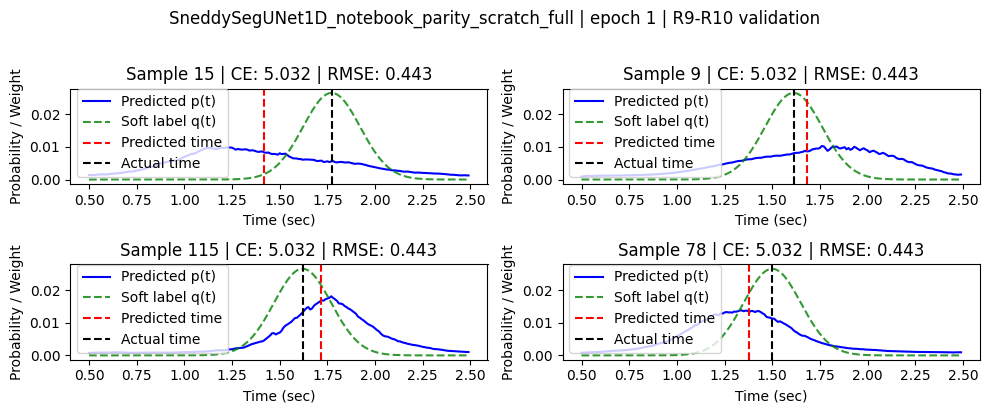

New best validation NRMSE: 972.497827 at epoch 1
Epoch 2/100: 

Epoch 2 [38/38] Loss 6.2843 CE 5.0633 RMSE 0.4070 KL 0.0000 WASS 0.0000 NRMSE 0.9694: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9694 Total loss: 236.3874 Total CE: 191.4721 Total RMSE: 14.9718



Val [70/70] Loss 5.4220 CE 4.9839 RMSE 0.4380 NRMSE 0.9681: 100%|██████████| 70/70 [00:03<00:00, 21.21it/s]


Val NRMSE: 968.087, Val Loss: 5.366169, Val CE: 4.974702, Val RMSE: 0.391467


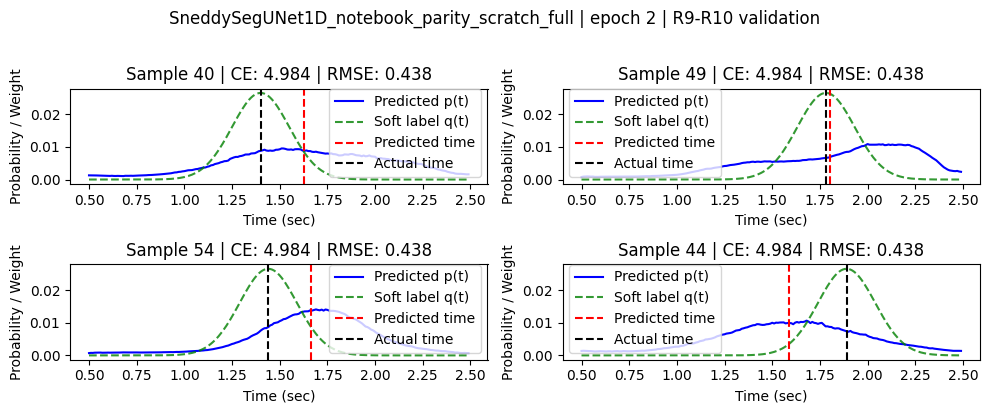

New best validation NRMSE: 968.087120 at epoch 2
Epoch 3/100: 

Epoch 3 [38/38] Loss 6.2261 CE 5.0141 RMSE 0.4040 KL 0.0000 WASS 0.0000 NRMSE 0.9624: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9624 Total loss: 235.3788 Total CE: 190.8171 Total RMSE: 14.8539



Val [70/70] Loss 5.3436 CE 4.9189 RMSE 0.4247 NRMSE 0.9622: 100%|██████████| 70/70 [00:03<00:00, 21.19it/s]


Val NRMSE: 962.232, Val Loss: 5.331556, Val CE: 4.943425, Val RMSE: 0.388131


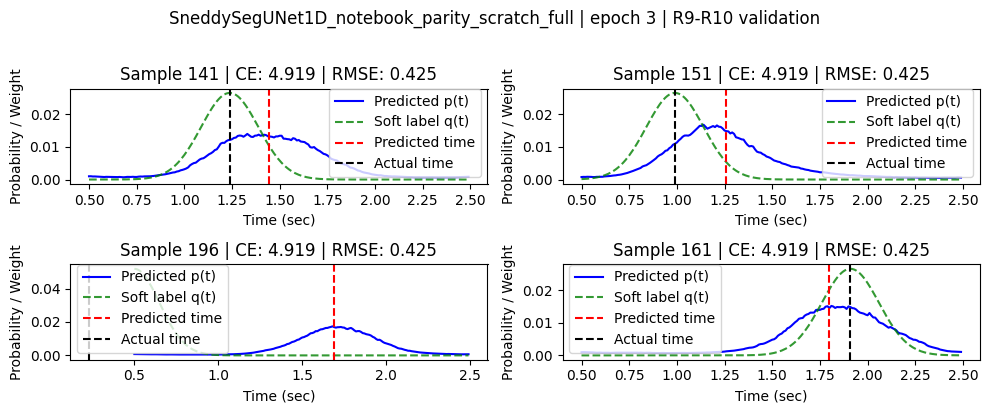

New best validation NRMSE: 962.232466 at epoch 3
Epoch 4/100: 

Epoch 4 [38/38] Loss 6.2472 CE 5.0355 RMSE 0.4039 KL 0.0000 WASS 0.0000 NRMSE 0.9584: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9584 Total loss: 234.8338 Total CE: 190.4183 Total RMSE: 14.8052



Val [70/70] Loss 5.3930 CE 4.9532 RMSE 0.4398 NRMSE 0.9552: 100%|██████████| 70/70 [00:03<00:00, 21.20it/s]


Val NRMSE: 955.215, Val Loss: 5.321139, Val CE: 4.935964, Val RMSE: 0.385175


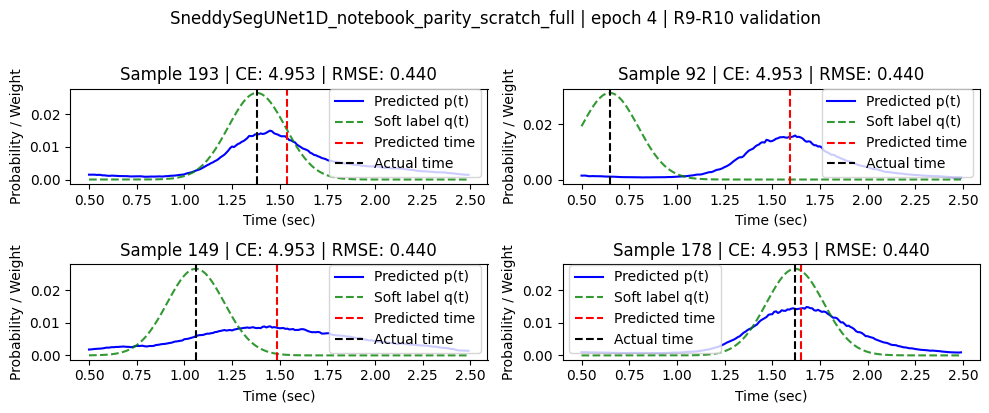

New best validation NRMSE: 955.214826 at epoch 4
Epoch 5/100: 

Epoch 5 [38/38] Loss 6.1101 CE 4.9764 RMSE 0.3779 KL 0.0000 WASS 0.0000 NRMSE 0.9540: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9540 Total loss: 234.3472 Total CE: 190.0905 Total RMSE: 14.7522



Val [70/70] Loss 5.3043 CE 4.8831 RMSE 0.4212 NRMSE 0.9483: 100%|██████████| 70/70 [00:03<00:00, 21.28it/s]


Val NRMSE: 948.298, Val Loss: 5.294835, Val CE: 4.912742, Val RMSE: 0.382093


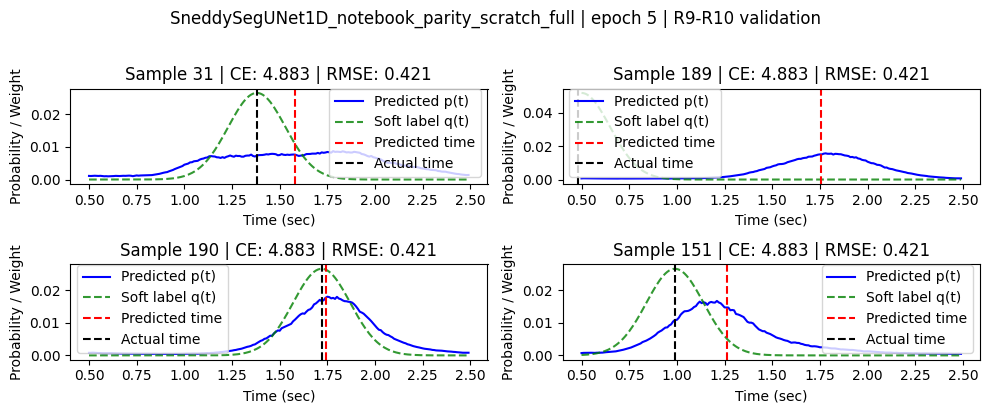

New best validation NRMSE: 948.298260 at epoch 5
Epoch 6/100: 

Epoch 6 [38/38] Loss 6.1066 CE 4.9689 RMSE 0.3792 KL 0.0000 WASS 0.0000 NRMSE 0.9476: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9476 Total loss: 233.3836 Total CE: 189.5699 Total RMSE: 14.6046



Val [70/70] Loss 5.2661 CE 4.8525 RMSE 0.4136 NRMSE 0.9451: 100%|██████████| 70/70 [00:03<00:00, 21.27it/s]


Val NRMSE: 945.069, Val Loss: 5.282625, Val CE: 4.902060, Val RMSE: 0.380565


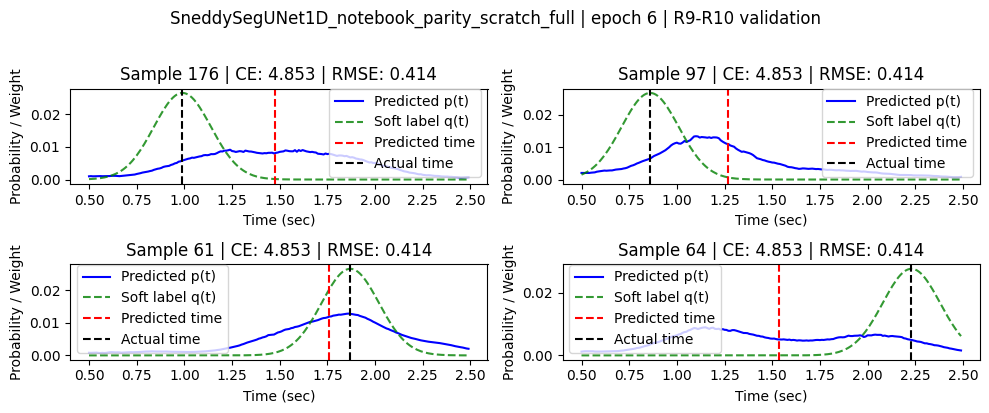

New best validation NRMSE: 945.069319 at epoch 6
Epoch 7/100: 

Epoch 7 [38/38] Loss 6.1320 CE 4.9805 RMSE 0.3838 KL 0.0000 WASS 0.0000 NRMSE 0.9416: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9416 Total loss: 232.8559 Total CE: 189.2810 Total RMSE: 14.5250



Val [70/70] Loss 5.2305 CE 4.8278 RMSE 0.4027 NRMSE 0.9569: 100%|██████████| 70/70 [00:03<00:00, 21.17it/s]


Val NRMSE: 956.901, Val Loss: 5.307689, Val CE: 4.921191, Val RMSE: 0.386498


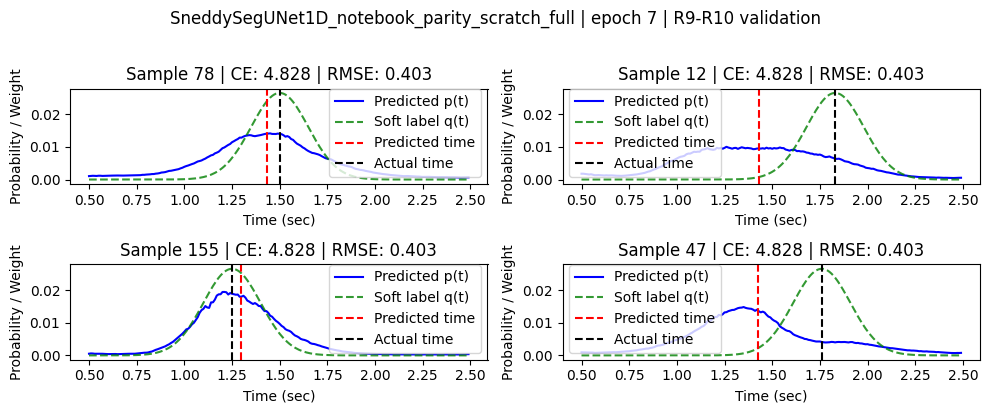

No validation improvement for 1/20 epochs.
Epoch 8/100: 

Epoch 8 [38/38] Loss 6.1039 CE 4.9654 RMSE 0.3795 KL 0.0000 WASS 0.0000 NRMSE 0.9393: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9393 Total loss: 232.6262 Total CE: 189.1600 Total RMSE: 14.4887



Val [70/70] Loss 5.2394 CE 4.8360 RMSE 0.4034 NRMSE 0.9420: 100%|██████████| 70/70 [00:03<00:00, 21.36it/s]


Val NRMSE: 942.026, Val Loss: 5.275950, Val CE: 4.896771, Val RMSE: 0.379179


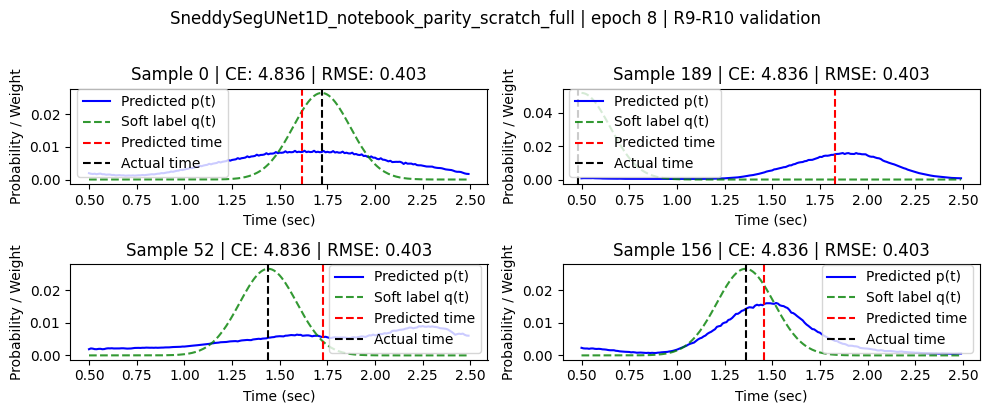

New best validation NRMSE: 942.025743 at epoch 8
Epoch 9/100: 

Epoch 9 [38/38] Loss 6.1243 CE 4.9746 RMSE 0.3832 KL 0.0000 WASS 0.0000 NRMSE 0.9323: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9323 Total loss: 231.9471 Total CE: 188.7155 Total RMSE: 14.4105



Val [70/70] Loss 5.1900 CE 4.7952 RMSE 0.3948 NRMSE 0.9562: 100%|██████████| 70/70 [00:03<00:00, 21.27it/s]


Val NRMSE: 956.243, Val Loss: 5.305032, Val CE: 4.918839, Val RMSE: 0.386193


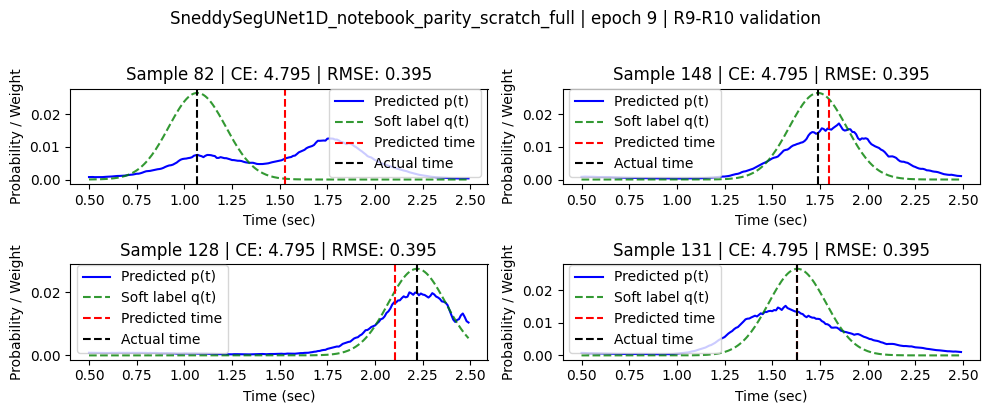

No validation improvement for 1/20 epochs.
Epoch 10/100: 

Epoch 10 [38/38] Loss 6.1531 CE 4.9706 RMSE 0.3942 KL 0.0000 WASS 0.0000 NRMSE 0.9299: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9299 Total loss: 231.5870 Total CE: 188.4920 Total RMSE: 14.3650



Val [70/70] Loss 5.2056 CE 4.8021 RMSE 0.4035 NRMSE 0.9369: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 936.917, Val Loss: 5.258180, Val CE: 4.880818, Val RMSE: 0.377362


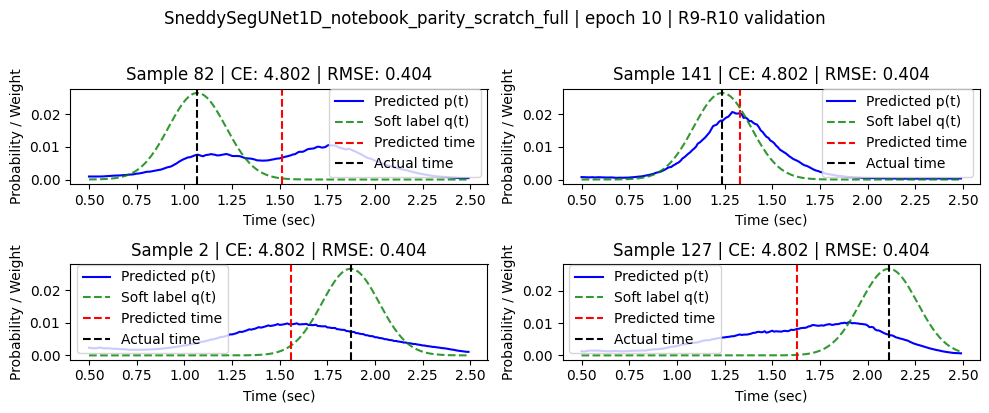

New best validation NRMSE: 936.917115 at epoch 10
Epoch 11/100: 

Epoch 11 [38/38] Loss 6.0879 CE 4.9453 RMSE 0.3809 KL 0.0000 WASS 0.0000 NRMSE 0.9270: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9270 Total loss: 231.1692 Total CE: 188.2672 Total RMSE: 14.3007



Val [70/70] Loss 5.2389 CE 4.8247 RMSE 0.4142 NRMSE 0.9437: 100%|██████████| 70/70 [00:03<00:00, 20.93it/s]


Val NRMSE: 943.734, Val Loss: 5.266175, Val CE: 4.885233, Val RMSE: 0.380943


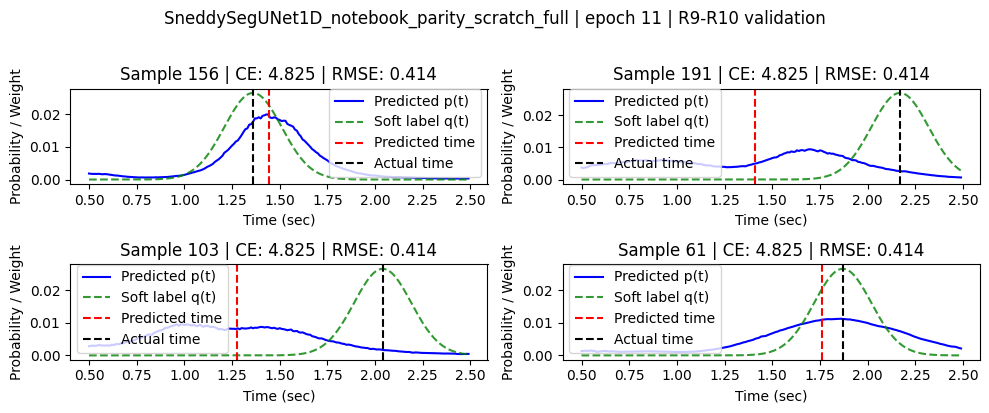

No validation improvement for 1/20 epochs.
Epoch 12/100: 

Epoch 12 [38/38] Loss 6.0733 CE 4.9571 RMSE 0.3720 KL 0.0000 WASS 0.0000 NRMSE 0.9207: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9207 Total loss: 230.5722 Total CE: 187.9299 Total RMSE: 14.2141



Val [70/70] Loss 5.2086 CE 4.8058 RMSE 0.4027 NRMSE 0.9352: 100%|██████████| 70/70 [00:03<00:00, 21.28it/s]


Val NRMSE: 935.231, Val Loss: 5.249373, Val CE: 4.873218, Val RMSE: 0.376155


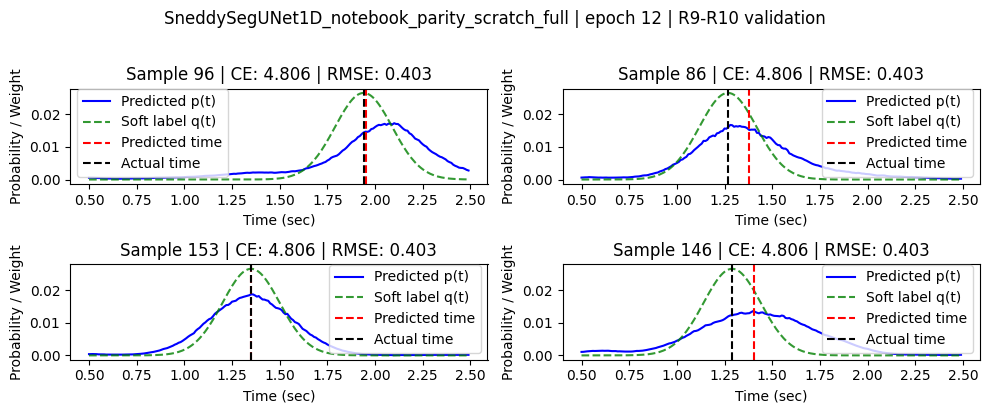

New best validation NRMSE: 935.230652 at epoch 12
Epoch 13/100: 

Epoch 13 [38/38] Loss 5.9680 CE 4.8974 RMSE 0.3569 KL 0.0000 WASS 0.0000 NRMSE 0.9165: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9165 Total loss: 230.0784 Total CE: 187.6971 Total RMSE: 14.1271



Val [70/70] Loss 5.2013 CE 4.8005 RMSE 0.4008 NRMSE 0.9361: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 936.142, Val Loss: 5.249214, Val CE: 4.873588, Val RMSE: 0.375627


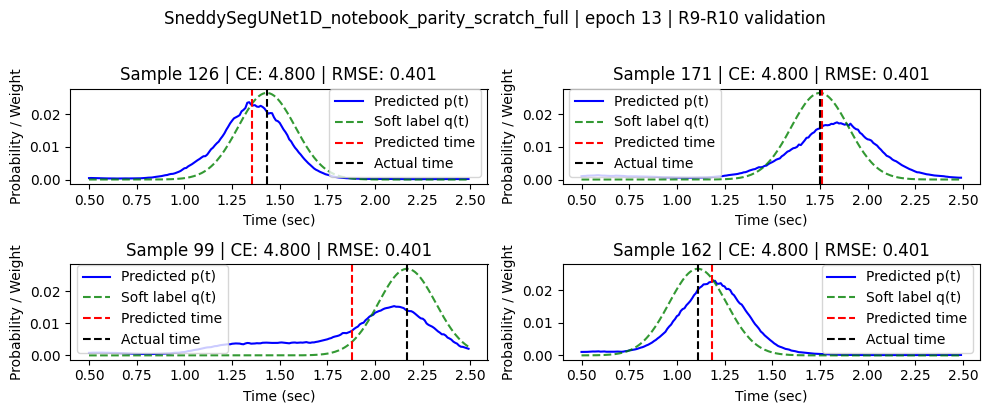

No validation improvement for 1/20 epochs.
Epoch 14/100: 

Epoch 14 [38/38] Loss 6.0477 CE 4.9262 RMSE 0.3738 KL 0.0000 WASS 0.0000 NRMSE 0.9125: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9125 Total loss: 229.8600 Total CE: 187.5554 Total RMSE: 14.1015



Val [70/70] Loss 5.1865 CE 4.7866 RMSE 0.3999 NRMSE 0.9333: 100%|██████████| 70/70 [00:03<00:00, 21.18it/s]


Val NRMSE: 933.254, Val Loss: 5.244235, Val CE: 4.868410, Val RMSE: 0.375825


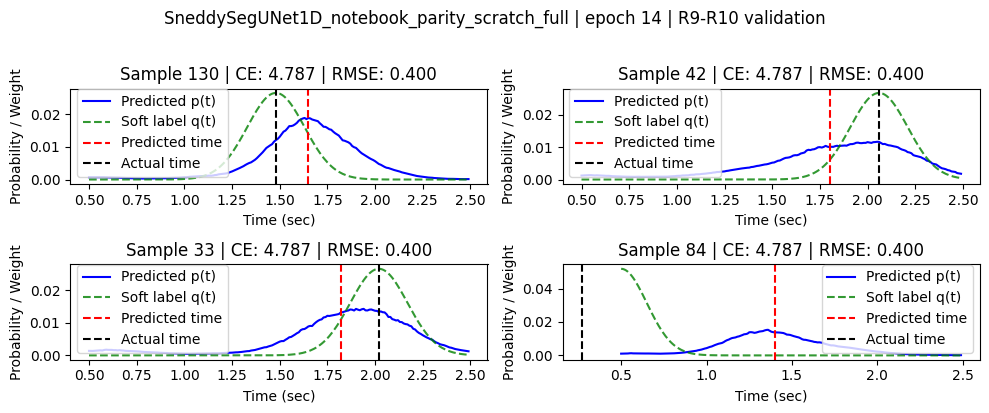

New best validation NRMSE: 933.253626 at epoch 14
Epoch 15/100: 

Epoch 15 [38/38] Loss 6.0003 CE 4.9372 RMSE 0.3544 KL 0.0000 WASS 0.0000 NRMSE 0.9069: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9069 Total loss: 229.2153 Total CE: 187.2562 Total RMSE: 13.9864



Val [70/70] Loss 5.1971 CE 4.7978 RMSE 0.3993 NRMSE 0.9393: 100%|██████████| 70/70 [00:03<00:00, 21.17it/s]


Val NRMSE: 939.336, Val Loss: 5.261335, Val CE: 4.883474, Val RMSE: 0.377860


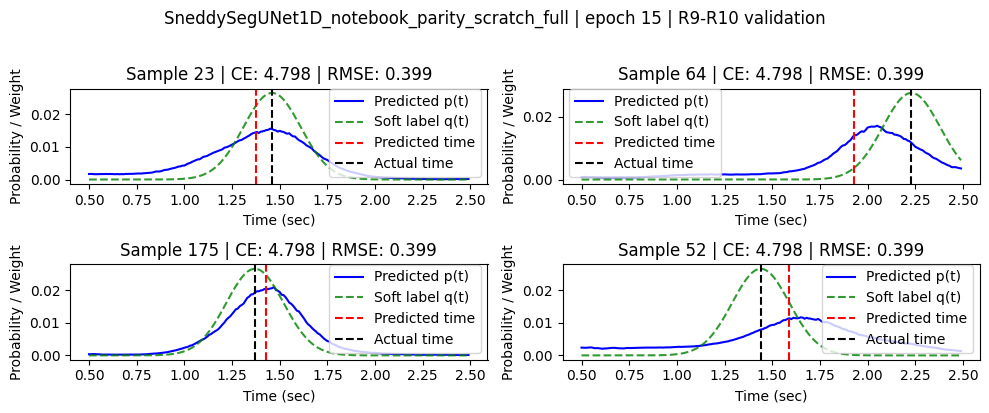

No validation improvement for 1/20 epochs.
Epoch 16/100: 

Epoch 16 [38/38] Loss 5.9471 CE 4.8962 RMSE 0.3503 KL 0.0000 WASS 0.0000 NRMSE 0.9046: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9046 Total loss: 228.9457 Total CE: 187.0976 Total RMSE: 13.9494



Val [70/70] Loss 5.1981 CE 4.7918 RMSE 0.4063 NRMSE 0.9445: 100%|██████████| 70/70 [00:03<00:00, 21.14it/s]


Val NRMSE: 944.516, Val Loss: 5.268759, Val CE: 4.889018, Val RMSE: 0.379740


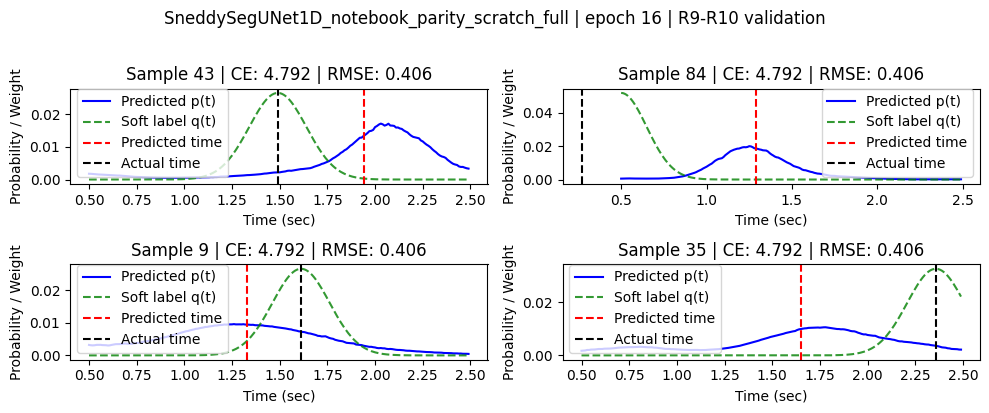

No validation improvement for 2/20 epochs.
Epoch 17/100: 

Epoch 17 [38/38] Loss 6.0298 CE 4.9214 RMSE 0.3695 KL 0.0000 WASS 0.0000 NRMSE 0.9053: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9053 Total loss: 229.0154 Total CE: 187.1339 Total RMSE: 13.9605



Val [70/70] Loss 5.1999 CE 4.7989 RMSE 0.4011 NRMSE 0.9471: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 947.094, Val Loss: 5.272676, Val CE: 4.890460, Val RMSE: 0.382216


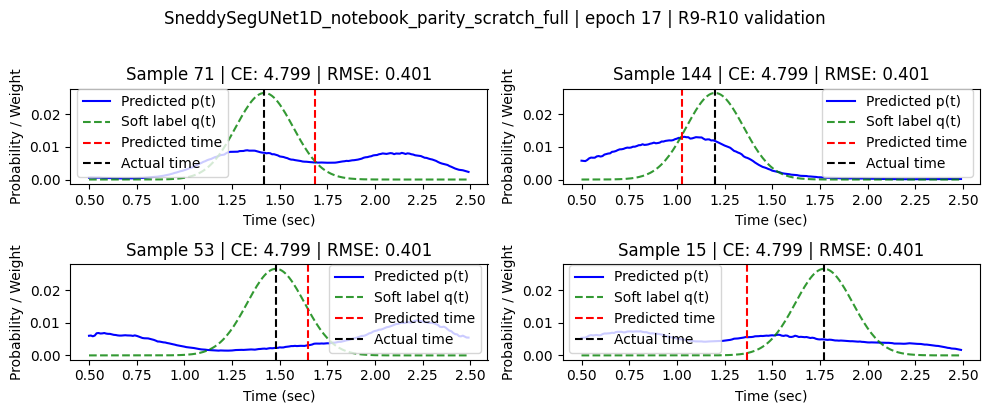

No validation improvement for 3/20 epochs.
Epoch 18/100: 

Epoch 18 [38/38] Loss 5.9621 CE 4.9007 RMSE 0.3538 KL 0.0000 WASS 0.0000 NRMSE 0.9000: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9000 Total loss: 228.6336 Total CE: 186.9626 Total RMSE: 13.8903



Val [70/70] Loss 5.2075 CE 4.8029 RMSE 0.4046 NRMSE 0.9498: 100%|██████████| 70/70 [00:03<00:00, 21.27it/s]


Val NRMSE: 949.780, Val Loss: 5.270930, Val CE: 4.887747, Val RMSE: 0.383183


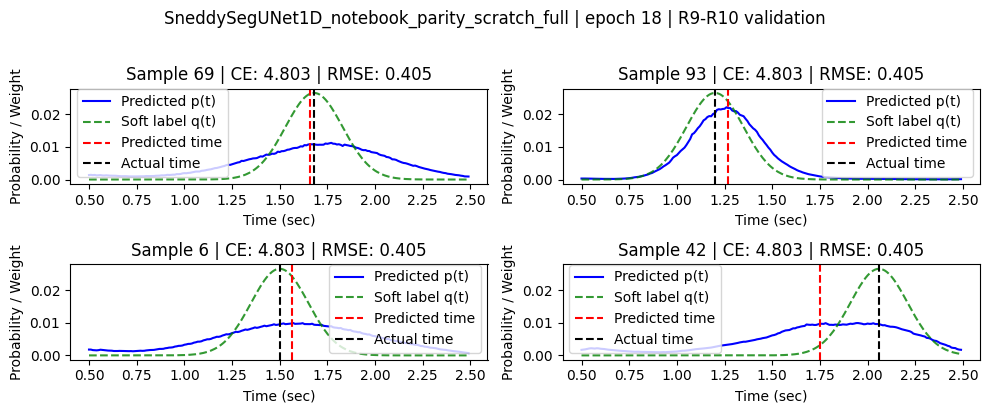

No validation improvement for 4/20 epochs.
Epoch 19/100: 

Epoch 19 [38/38] Loss 5.9882 CE 4.9107 RMSE 0.3592 KL 0.0000 WASS 0.0000 NRMSE 0.8960: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8960 Total loss: 228.3371 Total CE: 186.8532 Total RMSE: 13.8280



Val [70/70] Loss 5.2369 CE 4.8250 RMSE 0.4119 NRMSE 0.9347: 100%|██████████| 70/70 [00:03<00:00, 21.24it/s]


Val NRMSE: 934.671, Val Loss: 5.239617, Val CE: 4.864975, Val RMSE: 0.374642


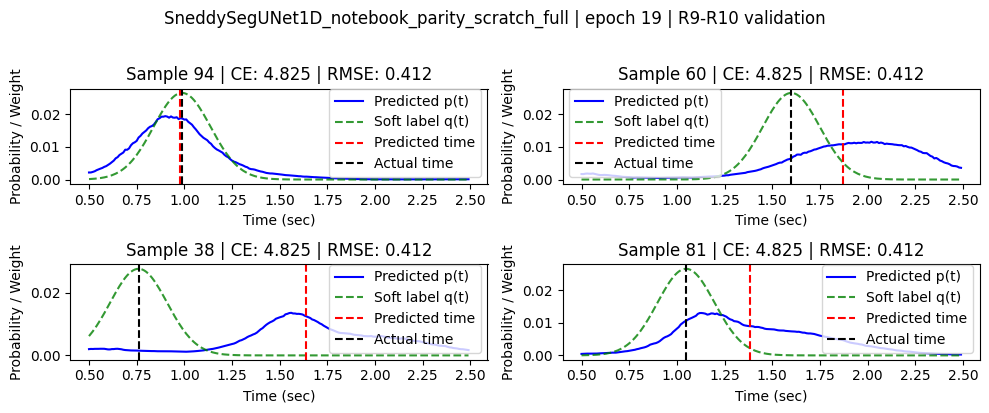

No validation improvement for 5/20 epochs.
Epoch 20/100: 

Epoch 20 [38/38] Loss 6.0001 CE 4.9107 RMSE 0.3631 KL 0.0000 WASS 0.0000 NRMSE 0.8953: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8953 Total loss: 228.2738 Total CE: 186.8106 Total RMSE: 13.8211



Val [70/70] Loss 5.1924 CE 4.7889 RMSE 0.4035 NRMSE 0.9381: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 938.147, Val Loss: 5.246702, Val CE: 4.869646, Val RMSE: 0.377056


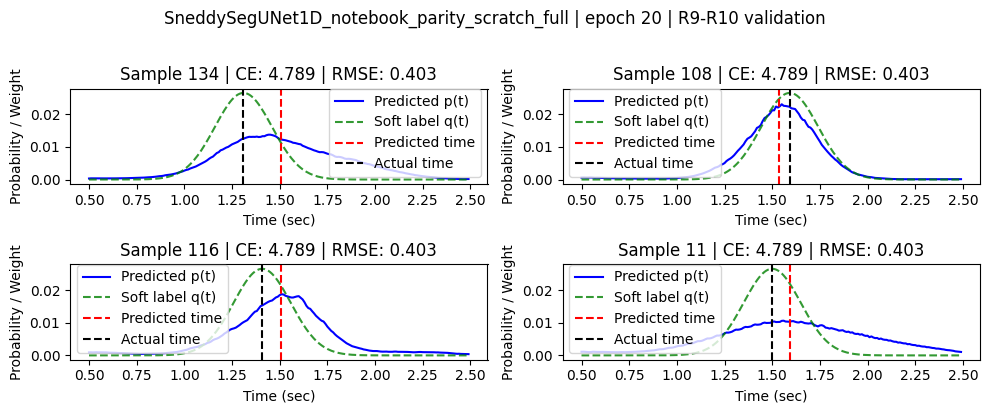

No validation improvement for 6/20 epochs.
Epoch 21/100: 

Epoch 21 [38/38] Loss 6.0073 CE 4.9248 RMSE 0.3608 KL 0.0000 WASS 0.0000 NRMSE 0.8898: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8898 Total loss: 227.8123 Total CE: 186.6409 Total RMSE: 13.7238



Val [70/70] Loss 5.1830 CE 4.7865 RMSE 0.3965 NRMSE 0.9373: 100%|██████████| 70/70 [00:03<00:00, 21.32it/s]


Val NRMSE: 937.292, Val Loss: 5.244488, Val CE: 4.868045, Val RMSE: 0.376443


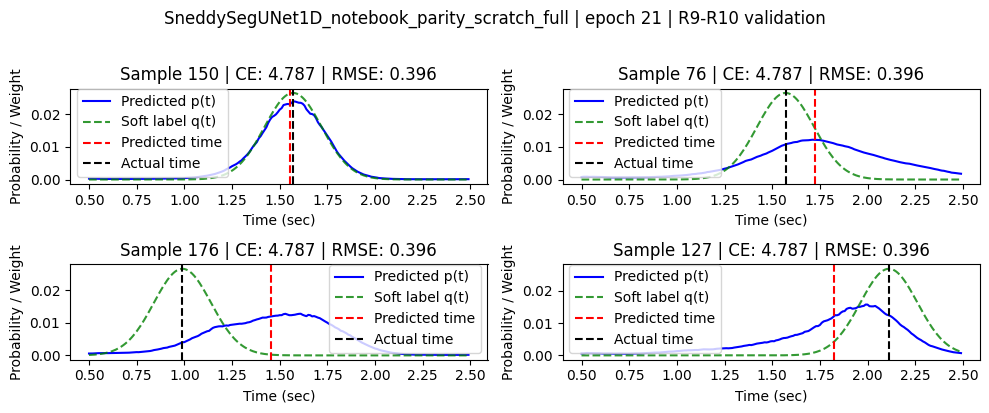

No validation improvement for 7/20 epochs.
Epoch 22/100: 

Epoch 22 [38/38] Loss 5.9494 CE 4.9047 RMSE 0.3482 KL 0.0000 WASS 0.0000 NRMSE 0.8861: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8861 Total loss: 227.5550 Total CE: 186.4371 Total RMSE: 13.7060



Val [70/70] Loss 5.2127 CE 4.8093 RMSE 0.4034 NRMSE 0.9527: 100%|██████████| 70/70 [00:03<00:00, 21.21it/s]


Val NRMSE: 952.744, Val Loss: 5.286784, Val CE: 4.903614, Val RMSE: 0.383170


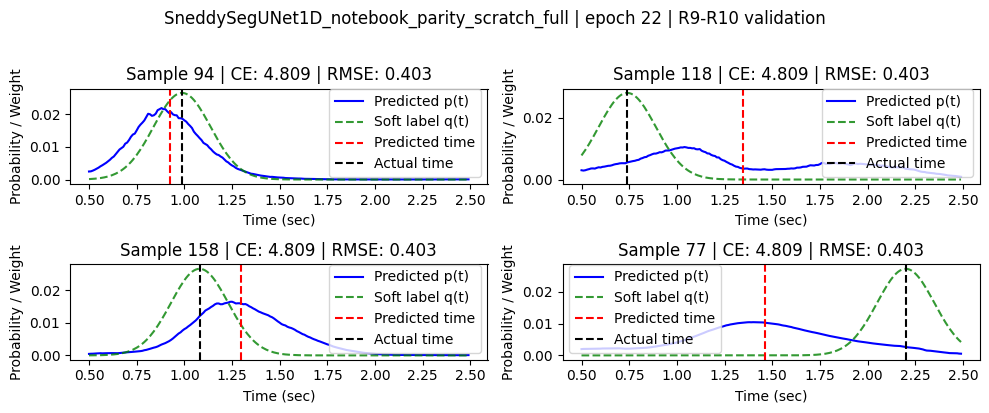

No validation improvement for 8/20 epochs.
Epoch 23/100: 

Epoch 23 [38/38] Loss 6.0326 CE 4.9117 RMSE 0.3736 KL 0.0000 WASS 0.0000 NRMSE 0.8859: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8859 Total loss: 227.4742 Total CE: 186.4436 Total RMSE: 13.6769



Val [70/70] Loss 5.1876 CE 4.7921 RMSE 0.3954 NRMSE 0.9383: 100%|██████████| 70/70 [00:03<00:00, 21.22it/s]


Val NRMSE: 938.265, Val Loss: 5.246672, Val CE: 4.869489, Val RMSE: 0.377183


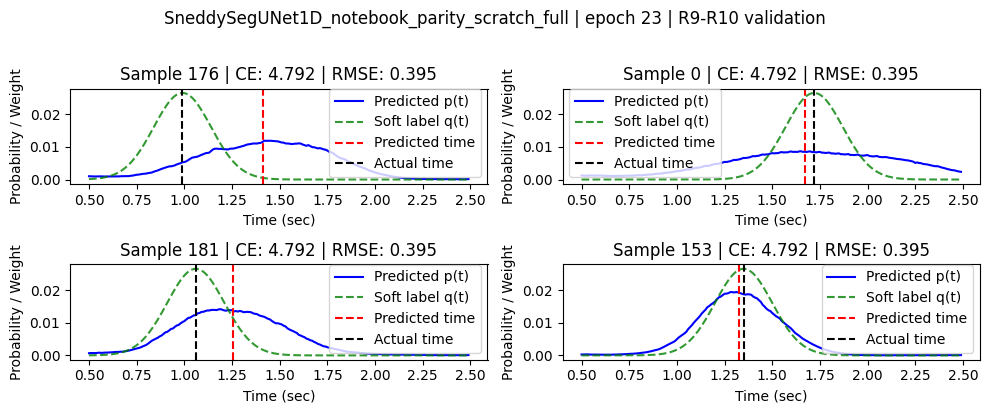

No validation improvement for 9/20 epochs.
Epoch 24/100: 

Epoch 24 [38/38] Loss 5.9832 CE 4.8924 RMSE 0.3636 KL 0.0000 WASS 0.0000 NRMSE 0.8805: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8805 Total loss: 227.0258 Total CE: 186.1964 Total RMSE: 13.6098



Val [70/70] Loss 5.1838 CE 4.7862 RMSE 0.3977 NRMSE 0.9465: 100%|██████████| 70/70 [00:03<00:00, 21.07it/s]


Val NRMSE: 946.492, Val Loss: 5.260328, Val CE: 4.879920, Val RMSE: 0.380409


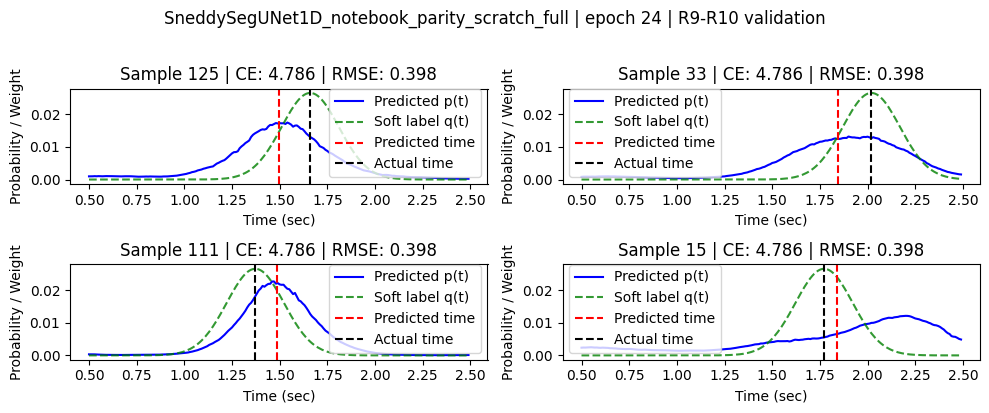

No validation improvement for 10/20 epochs.
Epoch 25/100: 

Epoch 25 [38/38] Loss 5.9519 CE 4.8902 RMSE 0.3539 KL 0.0000 WASS 0.0000 NRMSE 0.8772: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8772 Total loss: 226.6872 Total CE: 186.0294 Total RMSE: 13.5526



Val [70/70] Loss 5.2143 CE 4.8078 RMSE 0.4065 NRMSE 0.9446: 100%|██████████| 70/70 [00:03<00:00, 21.20it/s]


Val NRMSE: 944.642, Val Loss: 5.254034, Val CE: 4.874729, Val RMSE: 0.379305


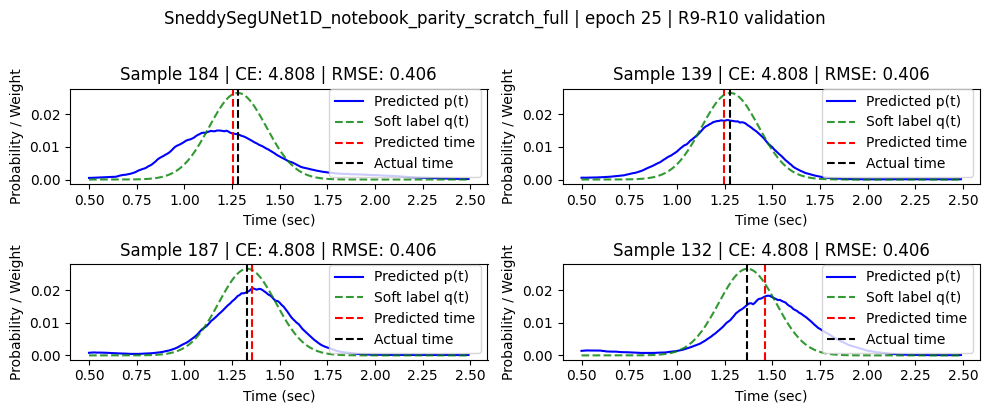

No validation improvement for 11/20 epochs.
Epoch 26/100: 

Epoch 26 [38/38] Loss 5.9086 CE 4.8728 RMSE 0.3453 KL 0.0000 WASS 0.0000 NRMSE 0.8755: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8755 Total loss: 226.5285 Total CE: 186.0091 Total RMSE: 13.5065



Val [70/70] Loss 5.1604 CE 4.7700 RMSE 0.3905 NRMSE 0.9538: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 953.763, Val Loss: 5.279709, Val CE: 4.894769, Val RMSE: 0.384941


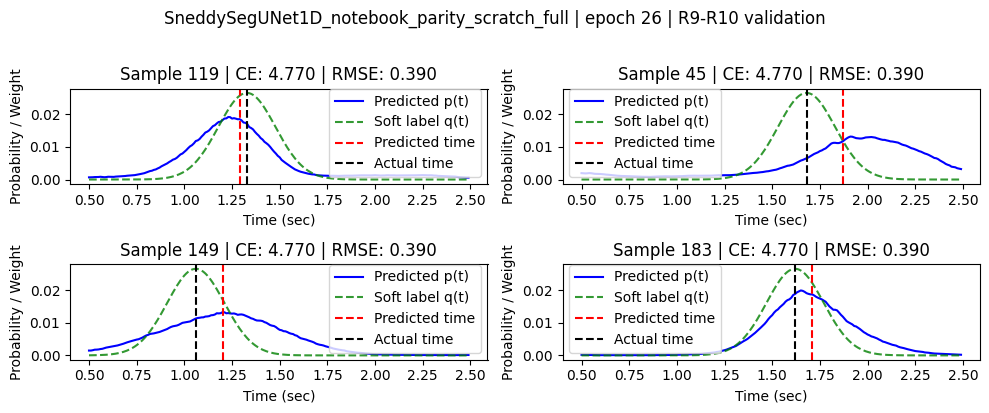

No validation improvement for 12/20 epochs.
Epoch 27/100: 

Epoch 27 [38/38] Loss 5.8944 CE 4.8688 RMSE 0.3419 KL 0.0000 WASS 0.0000 NRMSE 0.8731: 100%|██████████| 38/38 [00:49<00:00,  1.30s/it]

NRMSE: 0.8731 Total loss: 226.2635 Total CE: 185.8824 Total RMSE: 13.4603



Val [70/70] Loss 5.2243 CE 4.8092 RMSE 0.4151 NRMSE 0.9476: 100%|██████████| 70/70 [00:03<00:00, 20.97it/s]


Val NRMSE: 947.619, Val Loss: 5.260867, Val CE: 4.879701, Val RMSE: 0.381165


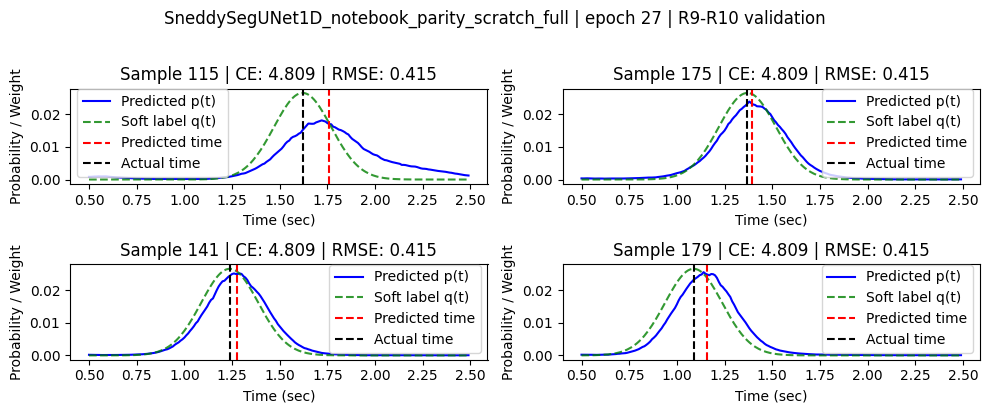

No validation improvement for 13/20 epochs.
Epoch 28/100: 

Epoch 28 [38/38] Loss 5.9766 CE 4.8859 RMSE 0.3636 KL 0.0000 WASS 0.0000 NRMSE 0.8664: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8664 Total loss: 225.8015 Total CE: 185.6752 Total RMSE: 13.3754



Val [70/70] Loss 5.1992 CE 4.7945 RMSE 0.4048 NRMSE 0.9558: 100%|██████████| 70/70 [00:03<00:00, 21.08it/s]


Val NRMSE: 955.808, Val Loss: 5.293227, Val CE: 4.908688, Val RMSE: 0.384539


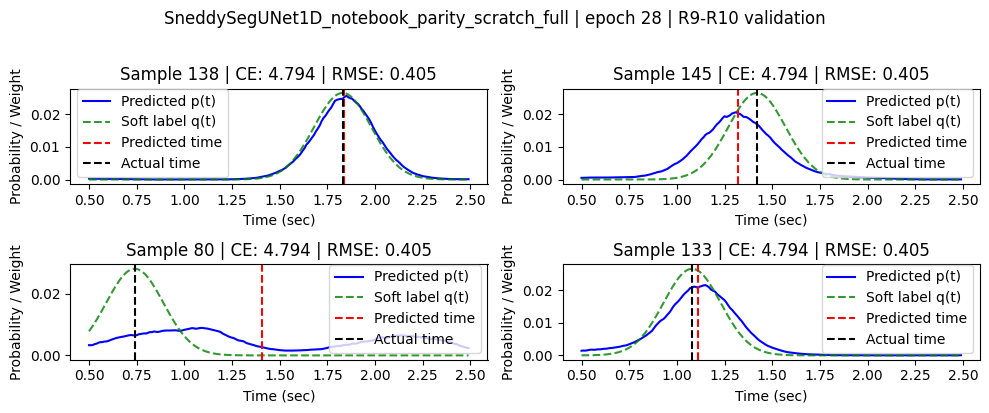

No validation improvement for 14/20 epochs.
Epoch 29/100: 

Epoch 29 [38/38] Loss 5.9626 CE 4.8859 RMSE 0.3589 KL 0.0000 WASS 0.0000 NRMSE 0.8658: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8658 Total loss: 225.7451 Total CE: 185.6454 Total RMSE: 13.3666



Val [70/70] Loss 5.1850 CE 4.7860 RMSE 0.3990 NRMSE 0.9508: 100%|██████████| 70/70 [00:03<00:00, 20.95it/s]


Val NRMSE: 950.784, Val Loss: 5.273475, Val CE: 4.891482, Val RMSE: 0.381993


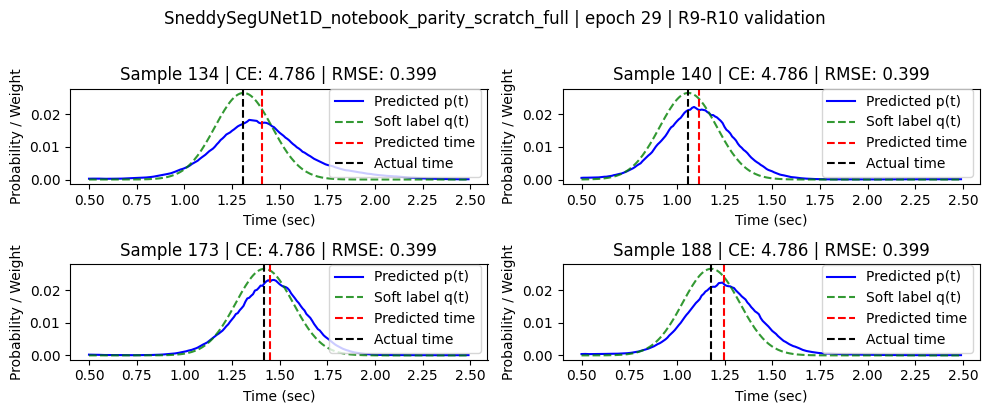

No validation improvement for 15/20 epochs.
Epoch 30/100: 

Epoch 30 [38/38] Loss 5.8716 CE 4.8586 RMSE 0.3377 KL 0.0000 WASS 0.0000 NRMSE 0.8636: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8636 Total loss: 225.5611 Total CE: 185.5871 Total RMSE: 13.3247



Val [70/70] Loss 5.1870 CE 4.7875 RMSE 0.3996 NRMSE 0.9571: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 957.086, Val Loss: 5.280021, Val CE: 4.893420, Val RMSE: 0.386601


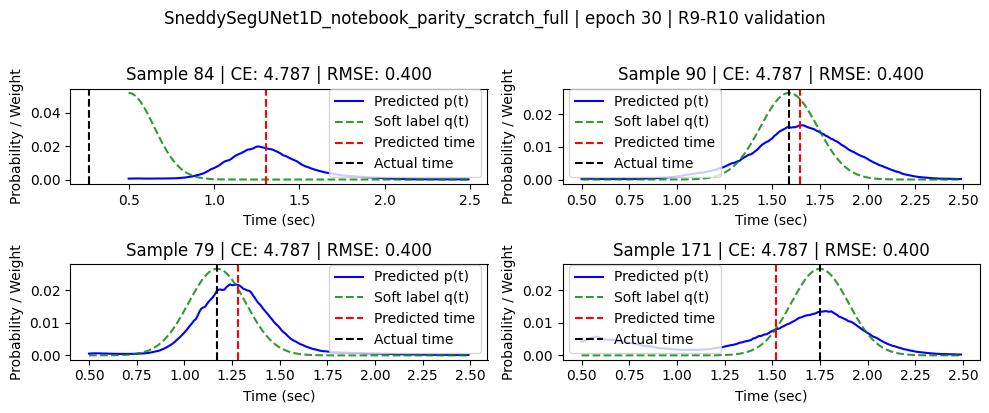

No validation improvement for 16/20 epochs.
Epoch 31/100: 

Epoch 31 [38/38] Loss 5.9095 CE 4.8754 RMSE 0.3447 KL 0.0000 WASS 0.0000 NRMSE 0.8581: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8581 Total loss: 225.1189 Total CE: 185.3212 Total RMSE: 13.2659



Val [70/70] Loss 5.1642 CE 4.7718 RMSE 0.3924 NRMSE 0.9616: 100%|██████████| 70/70 [00:03<00:00, 20.82it/s]


Val NRMSE: 961.584, Val Loss: 5.291296, Val CE: 4.903531, Val RMSE: 0.387765


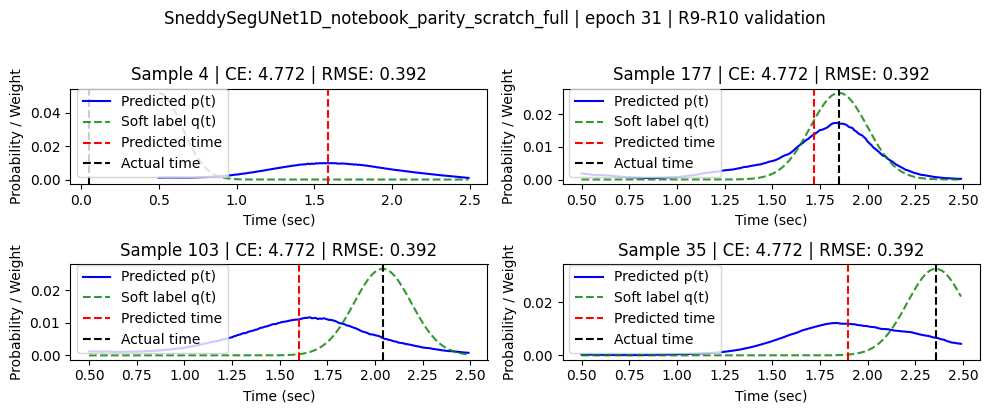

No validation improvement for 17/20 epochs.
Epoch 32/100: 

Epoch 32 [38/38] Loss 5.9558 CE 4.8888 RMSE 0.3557 KL 0.0000 WASS 0.0000 NRMSE 0.8553: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8553 Total loss: 224.8930 Total CE: 185.2542 Total RMSE: 13.2129



Val [70/70] Loss 5.1864 CE 4.7839 RMSE 0.4025 NRMSE 0.9541: 100%|██████████| 70/70 [00:03<00:00, 20.94it/s]


Val NRMSE: 954.117, Val Loss: 5.280969, Val CE: 4.896266, Val RMSE: 0.384704


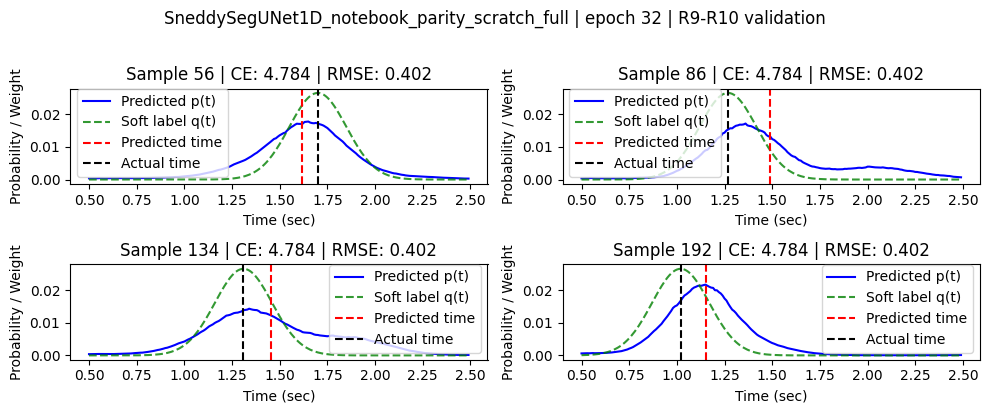

No validation improvement for 18/20 epochs.
Epoch 33/100: 

Epoch 33 [38/38] Loss 5.9197 CE 4.8781 RMSE 0.3472 KL 0.0000 WASS 0.0000 NRMSE 0.8503: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8503 Total loss: 224.4458 Total CE: 185.0883 Total RMSE: 13.1192



Val [70/70] Loss 5.2217 CE 4.8167 RMSE 0.4050 NRMSE 0.9532: 100%|██████████| 70/70 [00:03<00:00, 20.78it/s]


Val NRMSE: 953.217, Val Loss: 5.270688, Val CE: 4.888172, Val RMSE: 0.382516


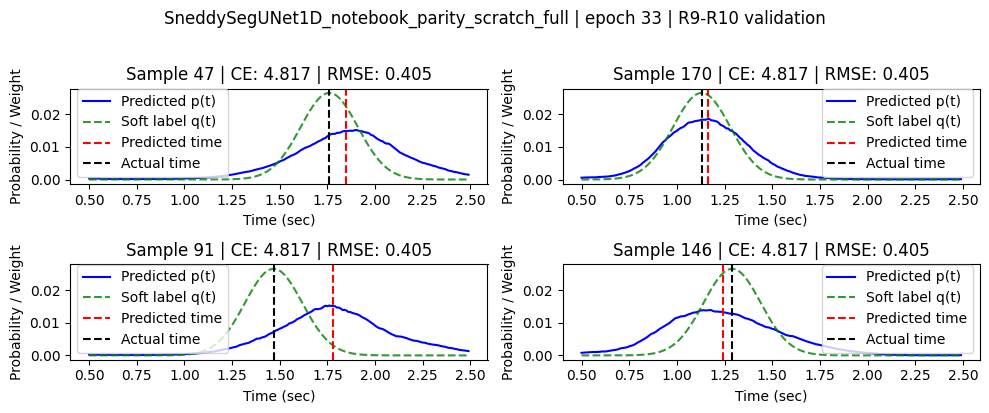

No validation improvement for 19/20 epochs.
Epoch 34/100: 

Epoch 34 [38/38] Loss 5.8799 CE 4.8738 RMSE 0.3354 KL 0.0000 WASS 0.0000 NRMSE 0.8508: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8508 Total loss: 224.5525 Total CE: 185.1820 Total RMSE: 13.1235



Val [70/70] Loss 5.2148 CE 4.8138 RMSE 0.4010 NRMSE 0.9491: 100%|██████████| 70/70 [00:03<00:00, 21.02it/s]


Val NRMSE: 949.108, Val Loss: 5.277477, Val CE: 4.895770, Val RMSE: 0.381707


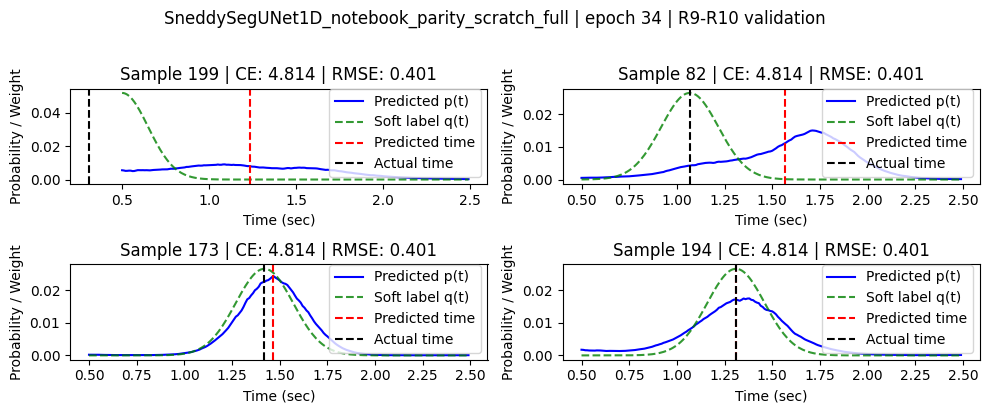

No validation improvement for 20/20 epochs.
Restart from checkpoint /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640/best_model.pth. Best Val NRMSE: 933.253626 at epoch 14.
Updating learning rate 0.001 -> 0.0005
Epoch 35/100: 

Epoch 35 [38/38] Loss 6.0675 CE 4.9539 RMSE 0.3712 KL 0.0000 WASS 0.0000 NRMSE 0.9096: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9096 Total loss: 229.4349 Total CE: 187.3451 Total RMSE: 14.0299



Val [70/70] Loss 5.1830 CE 4.7808 RMSE 0.4022 NRMSE 0.9362: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 936.208, Val Loss: 5.250528, Val CE: 4.874269, Val RMSE: 0.376259


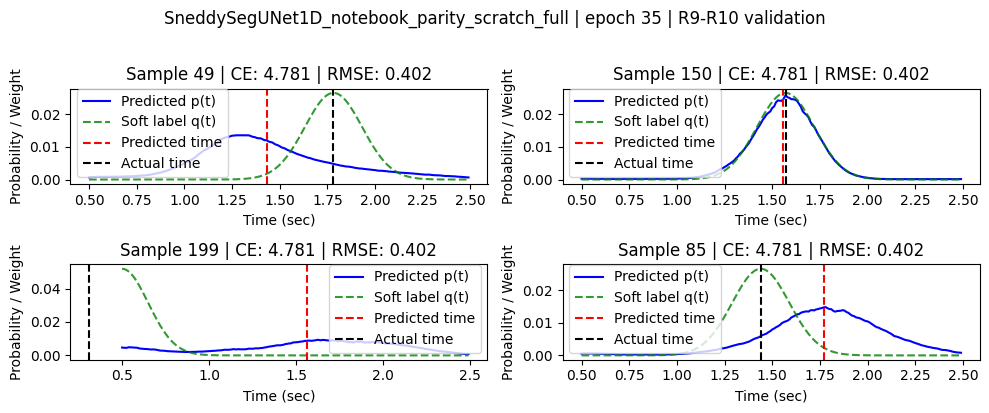

No validation improvement for 1/20 epochs.
Epoch 36/100: 

Epoch 36 [38/38] Loss 5.9880 CE 4.9032 RMSE 0.3616 KL 0.0000 WASS 0.0000 NRMSE 0.9027: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9027 Total loss: 228.6907 Total CE: 186.9488 Total RMSE: 13.9140



Val [70/70] Loss 5.1961 CE 4.7972 RMSE 0.3989 NRMSE 0.9349: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 934.948, Val Loss: 5.245985, Val CE: 4.870385, Val RMSE: 0.375600


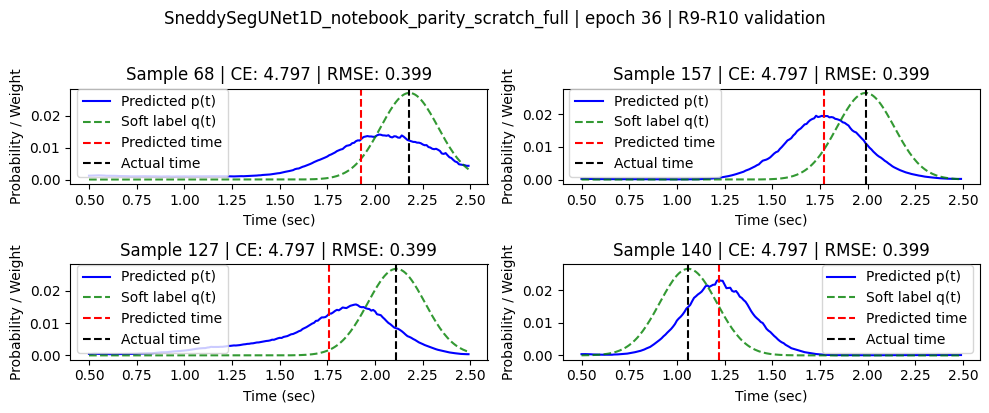

No validation improvement for 2/20 epochs.
Epoch 37/100: 

Epoch 37 [38/38] Loss 6.0268 CE 4.9108 RMSE 0.3720 KL 0.0000 WASS 0.0000 NRMSE 0.8988: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8988 Total loss: 228.4355 Total CE: 186.8174 Total RMSE: 13.8727



Val [70/70] Loss 5.1910 CE 4.7886 RMSE 0.4024 NRMSE 0.9390: 100%|██████████| 70/70 [00:03<00:00, 20.67it/s]


Val NRMSE: 938.965, Val Loss: 5.255114, Val CE: 4.877287, Val RMSE: 0.377827


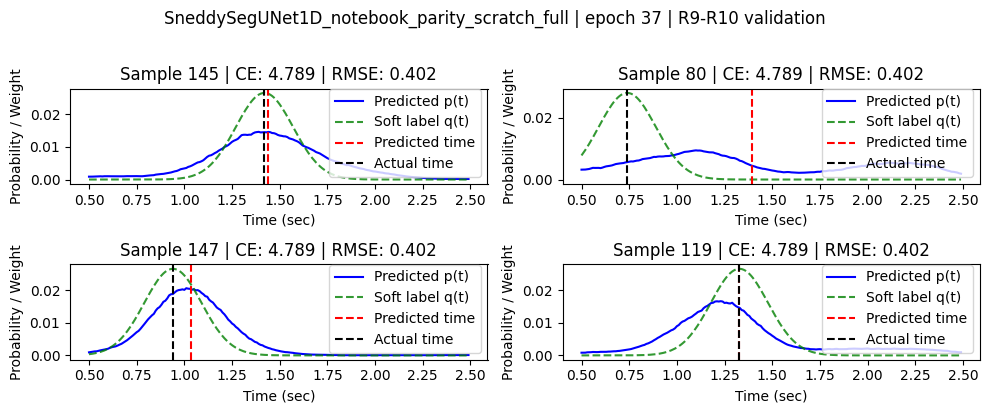

No validation improvement for 3/20 epochs.
Epoch 38/100: 

Epoch 38 [38/38] Loss 5.9322 CE 4.8895 RMSE 0.3476 KL 0.0000 WASS 0.0000 NRMSE 0.8939: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8939 Total loss: 227.9762 Total CE: 186.6234 Total RMSE: 13.7843



Val [70/70] Loss 5.1897 CE 4.7877 RMSE 0.4020 NRMSE 0.9360: 100%|██████████| 70/70 [00:03<00:00, 21.09it/s]


Val NRMSE: 935.986, Val Loss: 5.247202, Val CE: 4.870956, Val RMSE: 0.376246


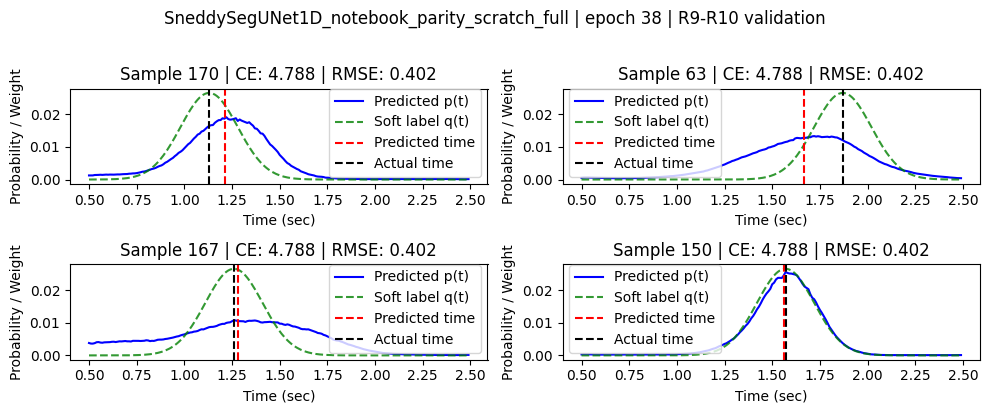

No validation improvement for 4/20 epochs.
Epoch 39/100: 

Epoch 39 [38/38] Loss 5.9496 CE 4.8881 RMSE 0.3538 KL 0.0000 WASS 0.0000 NRMSE 0.8949: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8949 Total loss: 228.1617 Total CE: 186.6985 Total RMSE: 13.8211



Val [70/70] Loss 5.1926 CE 4.7901 RMSE 0.4025 NRMSE 0.9349: 100%|██████████| 70/70 [00:03<00:00, 20.77it/s]


Val NRMSE: 934.874, Val Loss: 5.239871, Val CE: 4.863597, Val RMSE: 0.376275


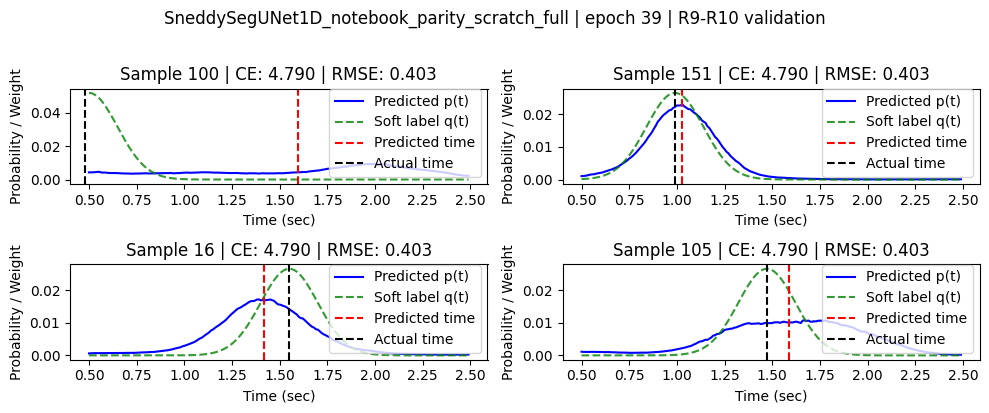

No validation improvement for 5/20 epochs.
Epoch 40/100: 

Epoch 40 [38/38] Loss 5.9974 CE 4.9132 RMSE 0.3614 KL 0.0000 WASS 0.0000 NRMSE 0.8933: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8933 Total loss: 228.0313 Total CE: 186.6894 Total RMSE: 13.7806



Val [70/70] Loss 5.2038 CE 4.7988 RMSE 0.4050 NRMSE 0.9447: 100%|██████████| 70/70 [00:03<00:00, 20.70it/s]


Val NRMSE: 944.715, Val Loss: 5.259860, Val CE: 4.880755, Val RMSE: 0.379105


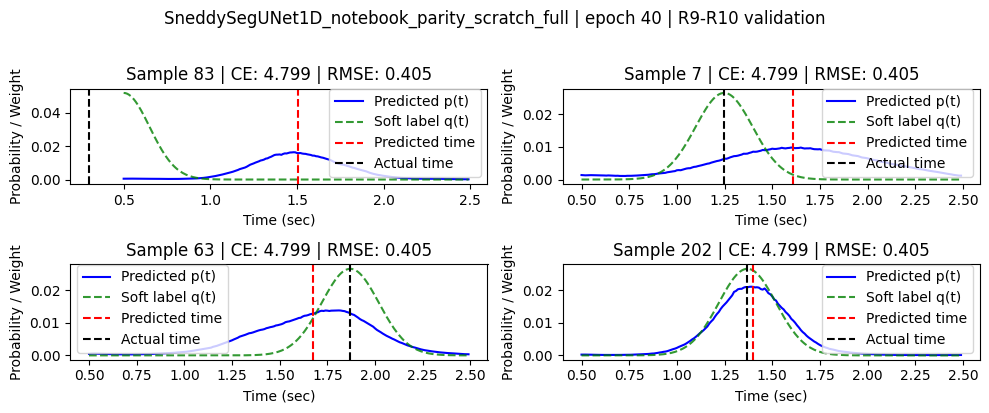

No validation improvement for 6/20 epochs.
Epoch 41/100: 

Epoch 41 [38/38] Loss 5.9643 CE 4.8858 RMSE 0.3595 KL 0.0000 WASS 0.0000 NRMSE 0.8907: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8907 Total loss: 227.7984 Total CE: 186.5051 Total RMSE: 13.7644



Val [70/70] Loss 5.2203 CE 4.8101 RMSE 0.4102 NRMSE 0.9441: 100%|██████████| 70/70 [00:03<00:00, 20.99it/s]


Val NRMSE: 944.085, Val Loss: 5.261800, Val CE: 4.882541, Val RMSE: 0.379259


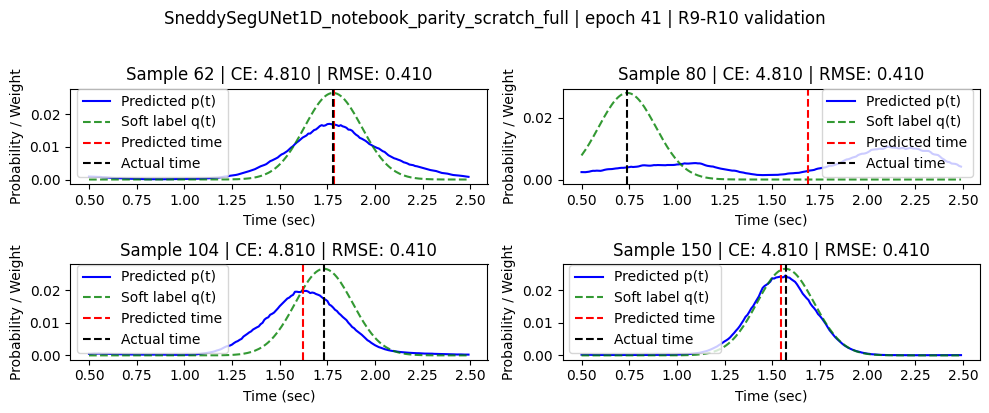

No validation improvement for 7/20 epochs.
Epoch 42/100: 

Epoch 42 [38/38] Loss 5.9626 CE 4.9038 RMSE 0.3530 KL 0.0000 WASS 0.0000 NRMSE 0.8883: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8883 Total loss: 227.6200 Total CE: 186.5012 Total RMSE: 13.7063



Val [70/70] Loss 5.1891 CE 4.7848 RMSE 0.4043 NRMSE 0.9406: 100%|██████████| 70/70 [00:03<00:00, 20.98it/s]


Val NRMSE: 940.597, Val Loss: 5.254357, Val CE: 4.875598, Val RMSE: 0.378759


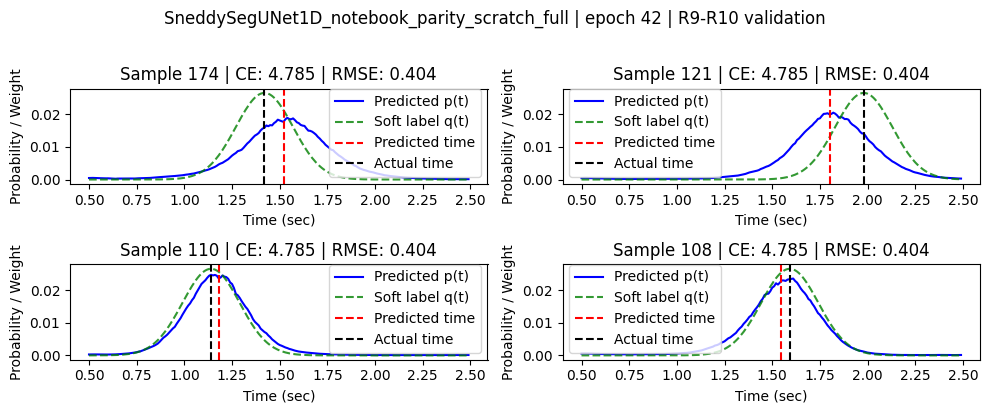

No validation improvement for 8/20 epochs.
Epoch 43/100: 

Epoch 43 [38/38] Loss 6.0017 CE 4.8915 RMSE 0.3700 KL 0.0000 WASS 0.0000 NRMSE 0.8844: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8844 Total loss: 227.2658 Total CE: 186.2529 Total RMSE: 13.6709



Val [70/70] Loss 5.2132 CE 4.8032 RMSE 0.4099 NRMSE 0.9441: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 944.091, Val Loss: 5.258254, Val CE: 4.878104, Val RMSE: 0.380150


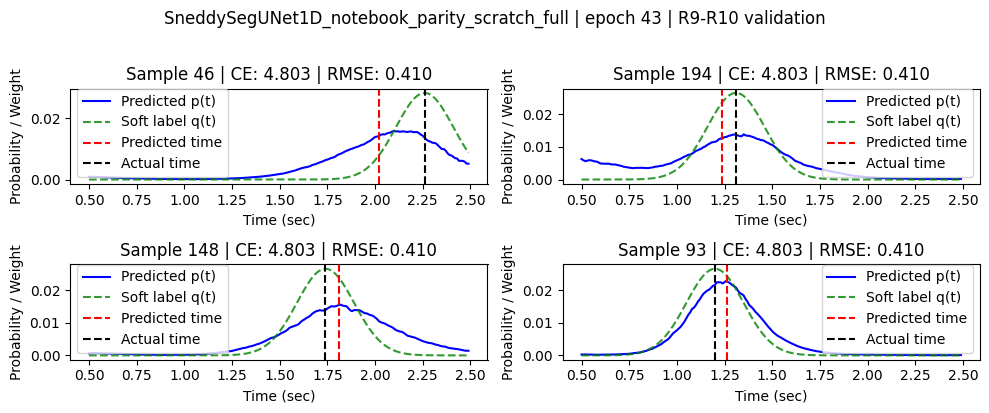

No validation improvement for 9/20 epochs.
Epoch 44/100: 

Epoch 44 [38/38] Loss 5.9537 CE 4.8928 RMSE 0.3536 KL 0.0000 WASS 0.0000 NRMSE 0.8828: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8828 Total loss: 227.1707 Total CE: 186.2970 Total RMSE: 13.6246



Val [70/70] Loss 5.2180 CE 4.8095 RMSE 0.4085 NRMSE 0.9687: 100%|██████████| 70/70 [00:03<00:00, 20.69it/s]


Val NRMSE: 968.716, Val Loss: 5.304305, Val CE: 4.912401, Val RMSE: 0.391905


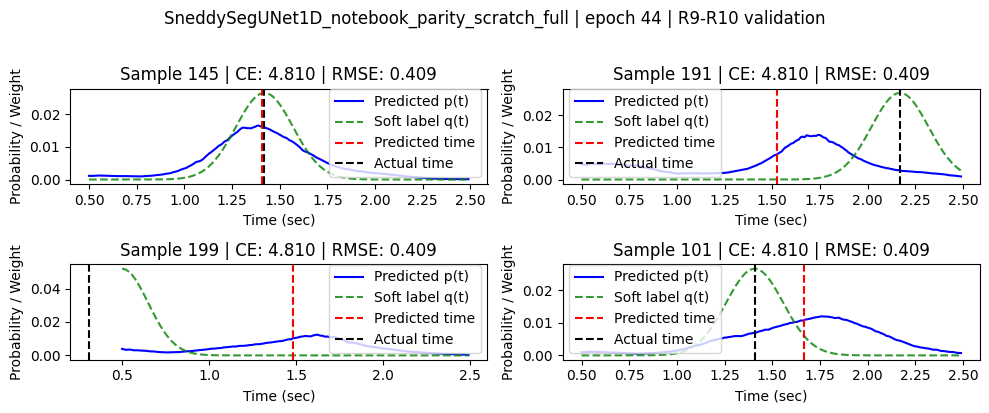

No validation improvement for 10/20 epochs.
Epoch 45/100: 

Epoch 45 [38/38] Loss 6.0204 CE 4.9260 RMSE 0.3648 KL 0.0000 WASS 0.0000 NRMSE 0.8792: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8792 Total loss: 226.9144 Total CE: 186.1717 Total RMSE: 13.5809



Val [70/70] Loss 5.2416 CE 4.8280 RMSE 0.4137 NRMSE 0.9478: 100%|██████████| 70/70 [00:03<00:00, 20.93it/s]


Val NRMSE: 947.789, Val Loss: 5.260615, Val CE: 4.878446, Val RMSE: 0.382169


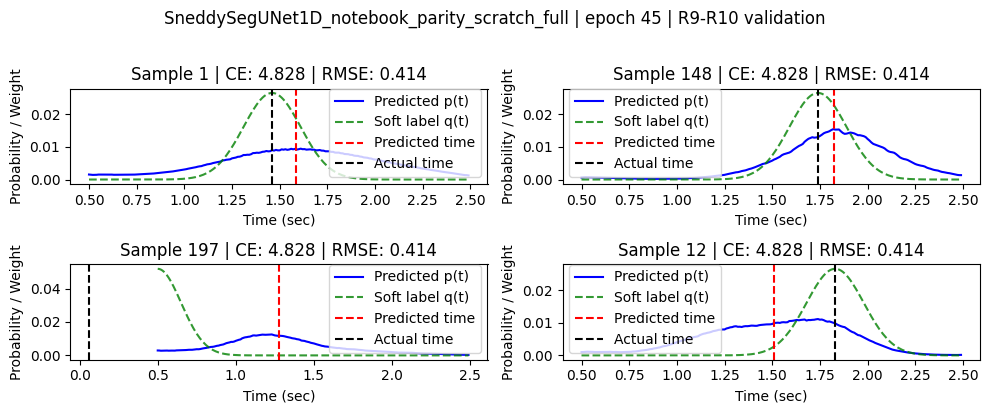

No validation improvement for 11/20 epochs.
Epoch 46/100: 

Epoch 46 [38/38] Loss 5.9425 CE 4.8898 RMSE 0.3509 KL 0.0000 WASS 0.0000 NRMSE 0.8728: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8728 Total loss: 226.3411 Total CE: 185.9159 Total RMSE: 13.4751



Val [70/70] Loss 5.2216 CE 4.8126 RMSE 0.4090 NRMSE 0.9533: 100%|██████████| 70/70 [00:03<00:00, 20.79it/s]


Val NRMSE: 953.262, Val Loss: 5.275429, Val CE: 4.891150, Val RMSE: 0.384279


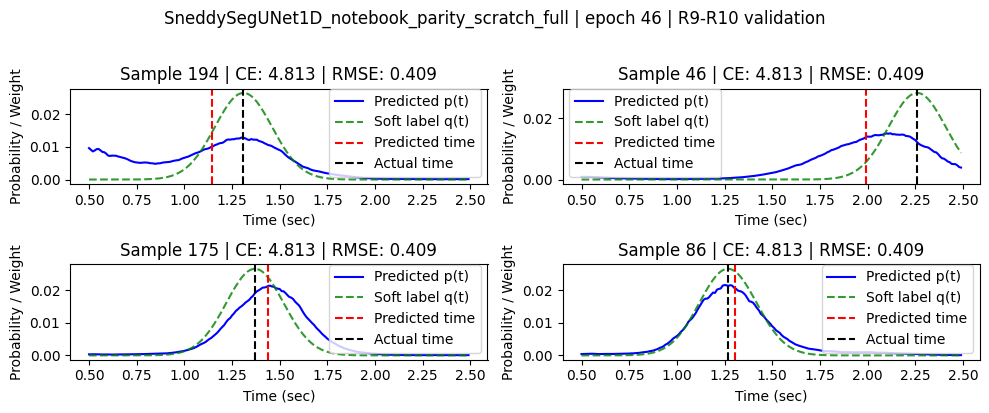

No validation improvement for 12/20 epochs.
Epoch 47/100: 

Epoch 47 [38/38] Loss 6.0131 CE 4.8948 RMSE 0.3728 KL 0.0000 WASS 0.0000 NRMSE 0.8766: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8766 Total loss: 226.6690 Total CE: 186.0171 Total RMSE: 13.5507



Val [70/70] Loss 5.2164 CE 4.8084 RMSE 0.4080 NRMSE 0.9462: 100%|██████████| 70/70 [00:03<00:00, 20.97it/s]


Val NRMSE: 946.189, Val Loss: 5.259236, Val CE: 4.878214, Val RMSE: 0.381023


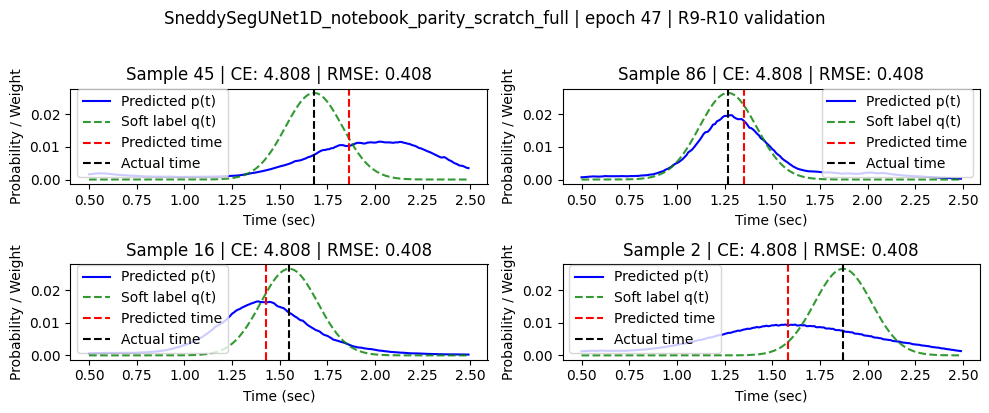

No validation improvement for 13/20 epochs.
Epoch 48/100: 

Epoch 48 [38/38] Loss 5.8793 CE 4.8605 RMSE 0.3396 KL 0.0000 WASS 0.0000 NRMSE 0.8725: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8725 Total loss: 226.2401 Total CE: 185.8590 Total RMSE: 13.4604



Val [70/70] Loss 5.2184 CE 4.8130 RMSE 0.4054 NRMSE 0.9523: 100%|██████████| 70/70 [00:03<00:00, 21.01it/s]


Val NRMSE: 952.336, Val Loss: 5.274762, Val CE: 4.891525, Val RMSE: 0.383236


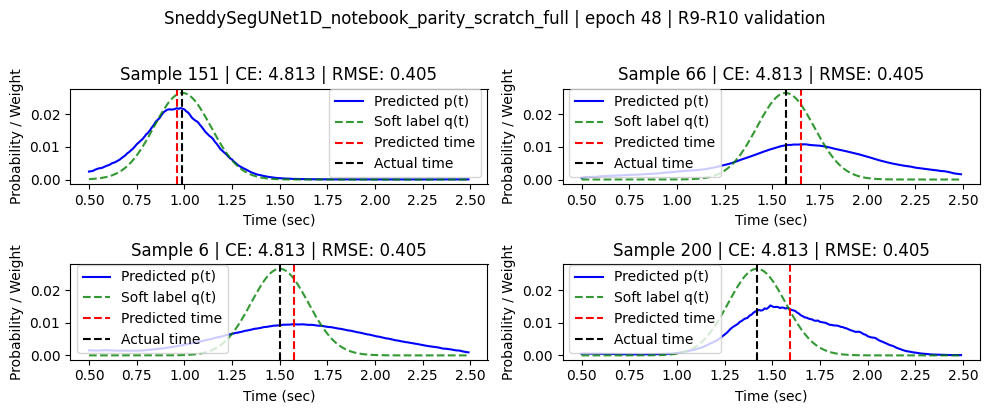

No validation improvement for 14/20 epochs.
Epoch 49/100: 

Epoch 49 [38/38] Loss 5.9827 CE 4.9009 RMSE 0.3606 KL 0.0000 WASS 0.0000 NRMSE 0.8700: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8700 Total loss: 226.1256 Total CE: 185.8168 Total RMSE: 13.4363



Val [70/70] Loss 5.2226 CE 4.8127 RMSE 0.4099 NRMSE 0.9496: 100%|██████████| 70/70 [00:03<00:00, 21.09it/s]


Val NRMSE: 949.576, Val Loss: 5.267034, Val CE: 4.885394, Val RMSE: 0.381641


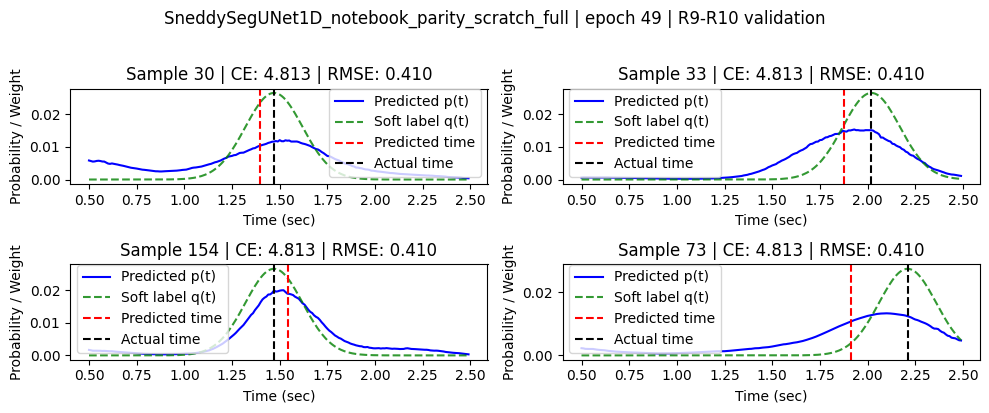

No validation improvement for 15/20 epochs.
Epoch 50/100: 

Epoch 50 [38/38] Loss 5.8840 CE 4.8566 RMSE 0.3425 KL 0.0000 WASS 0.0000 NRMSE 0.8656: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8656 Total loss: 225.7113 Total CE: 185.6675 Total RMSE: 13.3480



Val [70/70] Loss 5.2289 CE 4.8207 RMSE 0.4082 NRMSE 0.9597: 100%|██████████| 70/70 [00:03<00:00, 20.50it/s]


Val NRMSE: 959.728, Val Loss: 5.291210, Val CE: 4.904062, Val RMSE: 0.387148


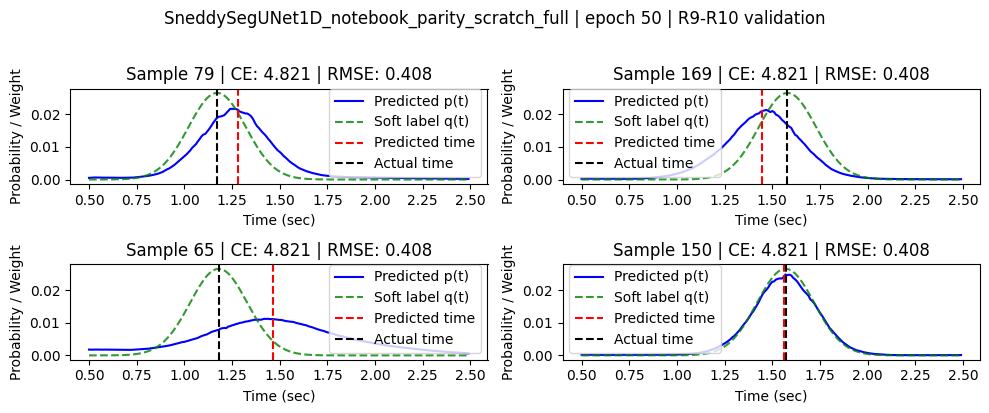

No validation improvement for 16/20 epochs.
Epoch 51/100: 

Epoch 51 [38/38] Loss 5.9121 CE 4.8708 RMSE 0.3471 KL 0.0000 WASS 0.0000 NRMSE 0.8649: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8649 Total loss: 225.5874 Total CE: 185.6167 Total RMSE: 13.3236



Val [70/70] Loss 5.2345 CE 4.8241 RMSE 0.4104 NRMSE 0.9577: 100%|██████████| 70/70 [00:03<00:00, 20.64it/s]


Val NRMSE: 957.672, Val Loss: 5.279902, Val CE: 4.893701, Val RMSE: 0.386201


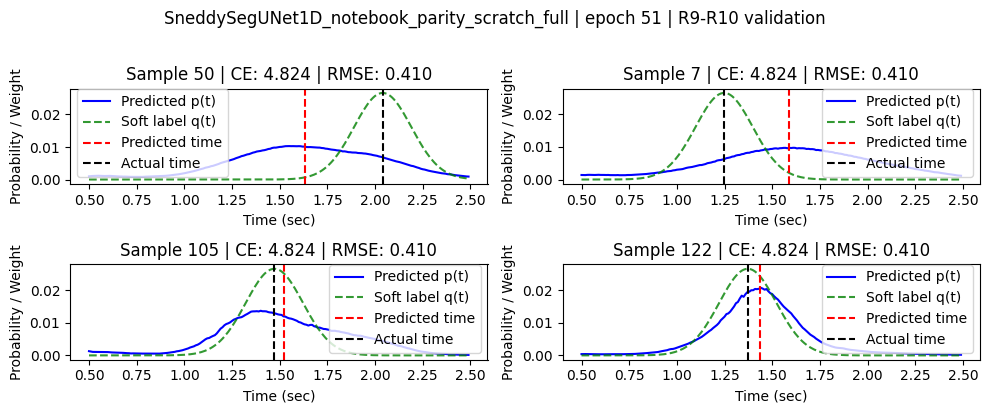

No validation improvement for 17/20 epochs.
Epoch 52/100: 

Epoch 52 [38/38] Loss 5.9279 CE 4.8818 RMSE 0.3487 KL 0.0000 WASS 0.0000 NRMSE 0.8639: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8639 Total loss: 225.5920 Total CE: 185.5852 Total RMSE: 13.3356



Val [70/70] Loss 5.2435 CE 4.8320 RMSE 0.4115 NRMSE 0.9507: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 950.657, Val Loss: 5.262811, Val CE: 4.880800, Val RMSE: 0.382011


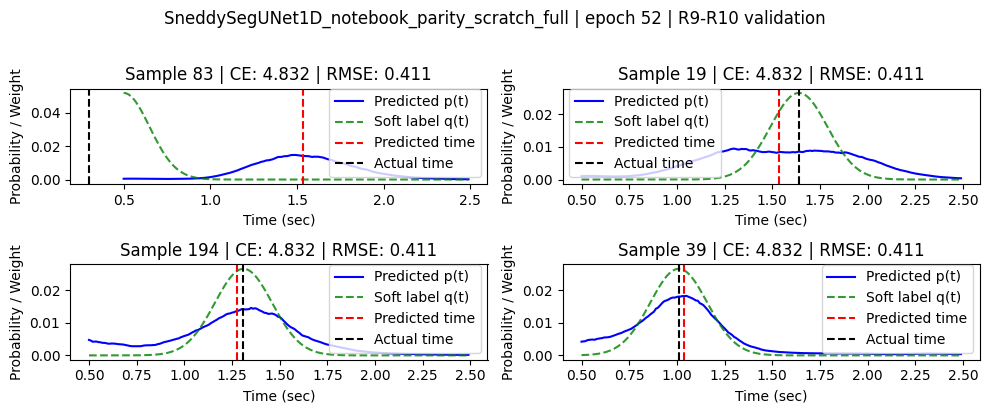

No validation improvement for 18/20 epochs.
Epoch 53/100: 

Epoch 53 [38/38] Loss 5.9085 CE 4.8761 RMSE 0.3441 KL 0.0000 WASS 0.0000 NRMSE 0.8551: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8551 Total loss: 224.9045 Total CE: 185.3085 Total RMSE: 13.1987



Val [70/70] Loss 5.2593 CE 4.8427 RMSE 0.4166 NRMSE 0.9655: 100%|██████████| 70/70 [00:03<00:00, 20.62it/s]


Val NRMSE: 965.473, Val Loss: 5.304152, Val CE: 4.914135, Val RMSE: 0.390018


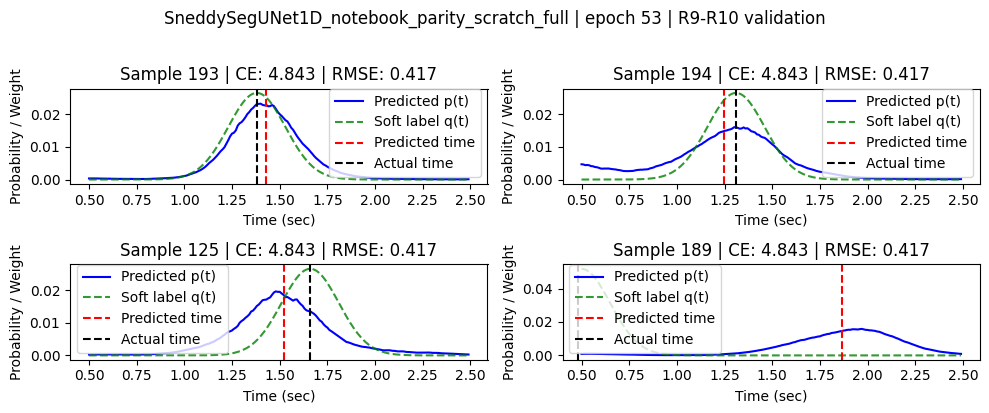

No validation improvement for 19/20 epochs.
Epoch 54/100: 

Epoch 54 [38/38] Loss 5.9433 CE 4.8807 RMSE 0.3542 KL 0.0000 WASS 0.0000 NRMSE 0.8575: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8575 Total loss: 225.2309 Total CE: 185.4422 Total RMSE: 13.2629



Val [70/70] Loss 5.2291 CE 4.8200 RMSE 0.4091 NRMSE 0.9589: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 958.924, Val Loss: 5.279512, Val CE: 4.893130, Val RMSE: 0.386382


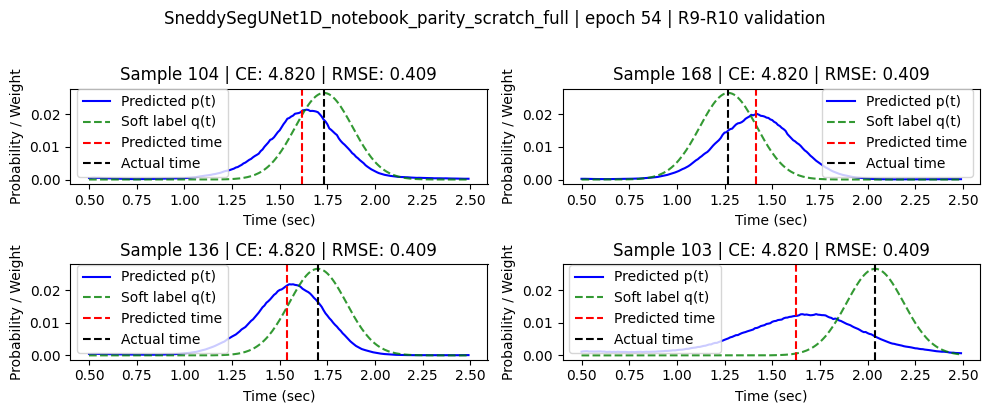

No validation improvement for 20/20 epochs.
Restart from checkpoint /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640/best_model.pth. Best Val NRMSE: 933.253626 at epoch 14.
Updating learning rate 0.0005 -> 0.00025
Epoch 55/100: 

Epoch 55 [38/38] Loss 6.0165 CE 4.9231 RMSE 0.3645 KL 0.0000 WASS 0.0000 NRMSE 0.9007: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9007 Total loss: 228.6379 Total CE: 186.9425 Total RMSE: 13.8985



Val [70/70] Loss 5.1814 CE 4.7822 RMSE 0.3992 NRMSE 0.9359: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 935.906, Val Loss: 5.246190, Val CE: 4.869584, Val RMSE: 0.376606


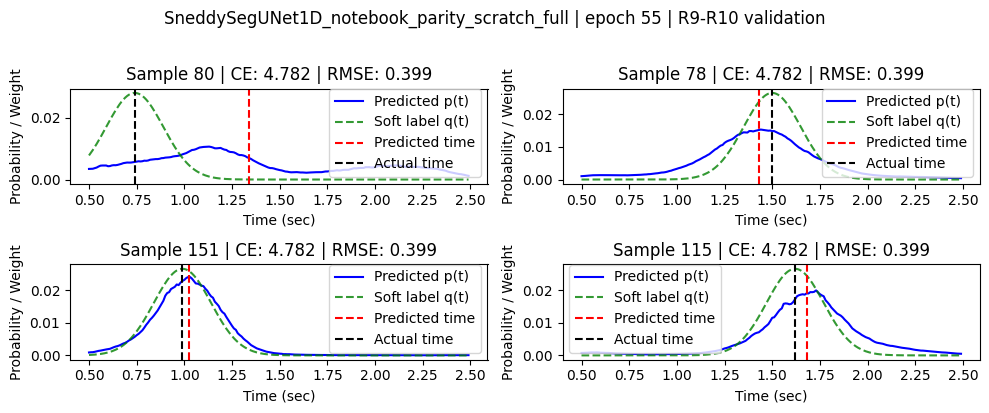

No validation improvement for 1/20 epochs.
Epoch 56/100: 

Epoch 56 [38/38] Loss 5.9688 CE 4.8908 RMSE 0.3593 KL 0.0000 WASS 0.0000 NRMSE 0.9052: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.9052 Total loss: 228.9645 Total CE: 187.0992 Total RMSE: 13.9551



Val [70/70] Loss 5.1846 CE 4.7845 RMSE 0.4001 NRMSE 0.9408: 100%|██████████| 70/70 [00:03<00:00, 20.85it/s]


Val NRMSE: 940.839, Val Loss: 5.255010, Val CE: 4.876587, Val RMSE: 0.378423


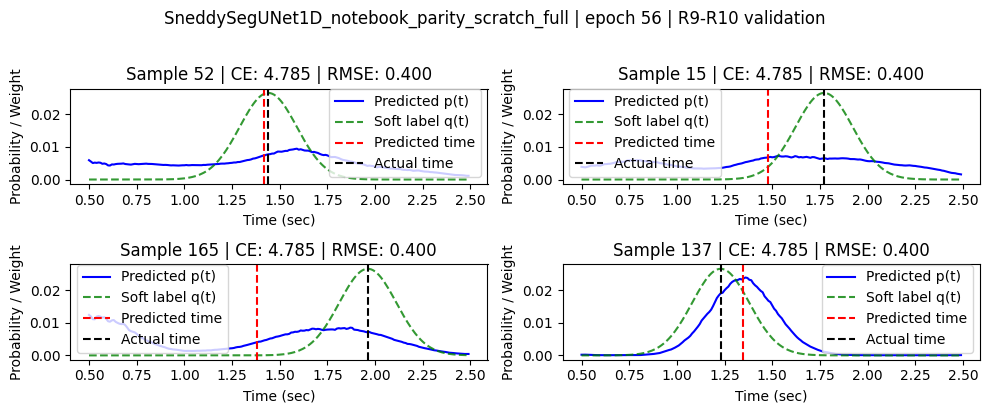

No validation improvement for 2/20 epochs.
Epoch 57/100: 

Epoch 57 [38/38] Loss 5.9683 CE 4.9019 RMSE 0.3555 KL 0.0000 WASS 0.0000 NRMSE 0.8983: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8983 Total loss: 228.4404 Total CE: 186.8283 Total RMSE: 13.8707



Val [70/70] Loss 5.1943 CE 4.7936 RMSE 0.4007 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 934.471, Val Loss: 5.246302, Val CE: 4.870604, Val RMSE: 0.375698


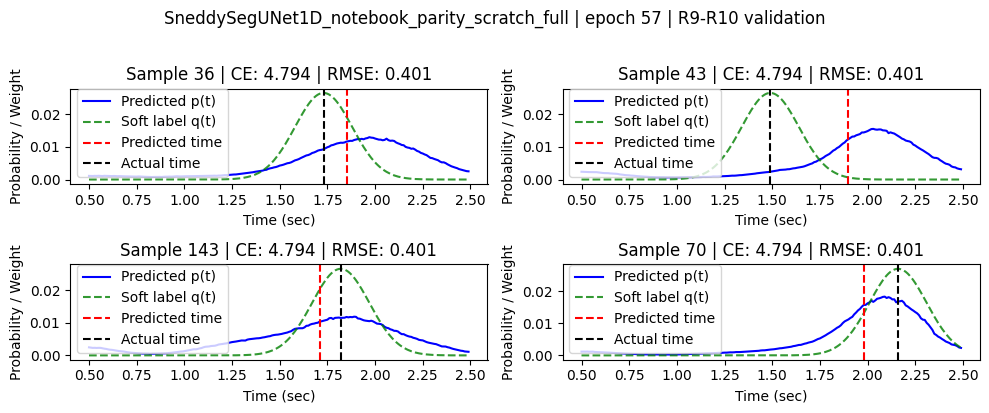

No validation improvement for 3/20 epochs.
Epoch 58/100: 

Epoch 58 [38/38] Loss 5.9863 CE 4.9098 RMSE 0.3588 KL 0.0000 WASS 0.0000 NRMSE 0.8970: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8970 Total loss: 228.2420 Total CE: 186.7377 Total RMSE: 13.8348



Val [70/70] Loss 5.1853 CE 4.7834 RMSE 0.4020 NRMSE 0.9452: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 945.169, Val Loss: 5.261331, Val CE: 4.880546, Val RMSE: 0.380785


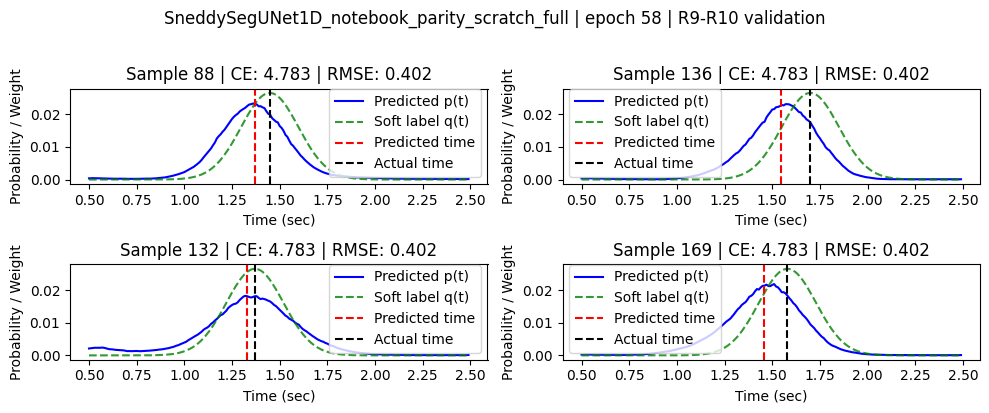

No validation improvement for 4/20 epochs.
Epoch 59/100: 

Epoch 59 [38/38] Loss 5.9748 CE 4.9105 RMSE 0.3548 KL 0.0000 WASS 0.0000 NRMSE 0.8969: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8969 Total loss: 228.3312 Total CE: 186.7732 Total RMSE: 13.8527



Val [70/70] Loss 5.1970 CE 4.7959 RMSE 0.4010 NRMSE 0.9393: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 939.299, Val Loss: 5.251123, Val CE: 4.872927, Val RMSE: 0.378196


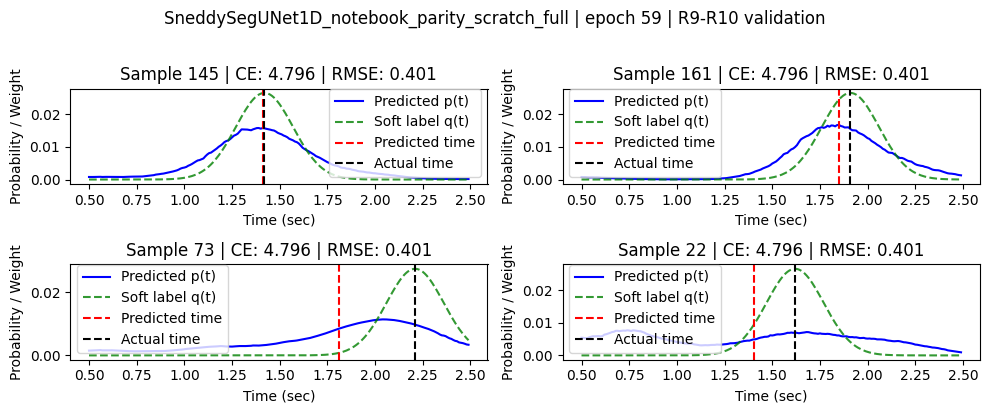

No validation improvement for 5/20 epochs.
Epoch 60/100: 

Epoch 60 [38/38] Loss 5.9582 CE 4.9010 RMSE 0.3524 KL 0.0000 WASS 0.0000 NRMSE 0.8927: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8927 Total loss: 228.0653 Total CE: 186.6837 Total RMSE: 13.7939



Val [70/70] Loss 5.1935 CE 4.7919 RMSE 0.4016 NRMSE 0.9372: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 937.210, Val Loss: 5.249135, Val CE: 4.871729, Val RMSE: 0.377406


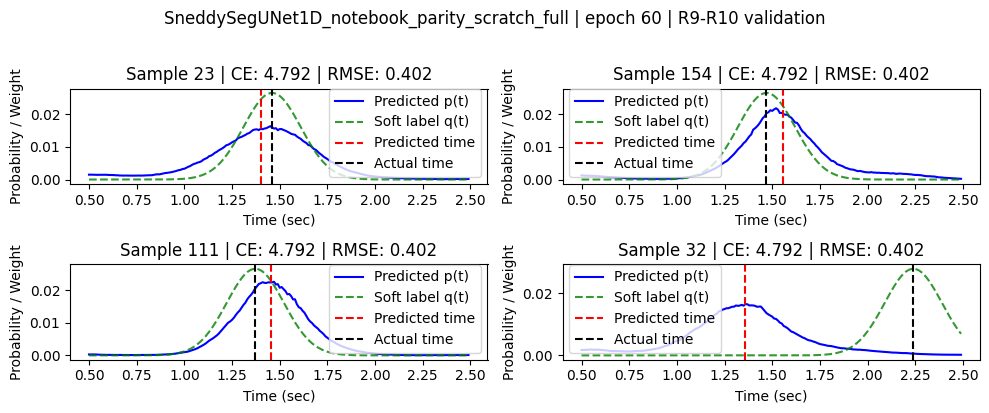

No validation improvement for 6/20 epochs.
Epoch 61/100: 

Epoch 61 [38/38] Loss 5.9985 CE 4.9084 RMSE 0.3633 KL 0.0000 WASS 0.0000 NRMSE 0.8912: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8912 Total loss: 227.9000 Total CE: 186.5451 Total RMSE: 13.7850



Val [70/70] Loss 5.2235 CE 4.8155 RMSE 0.4081 NRMSE 0.9346: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 934.562, Val Loss: 5.239555, Val CE: 4.864572, Val RMSE: 0.374983


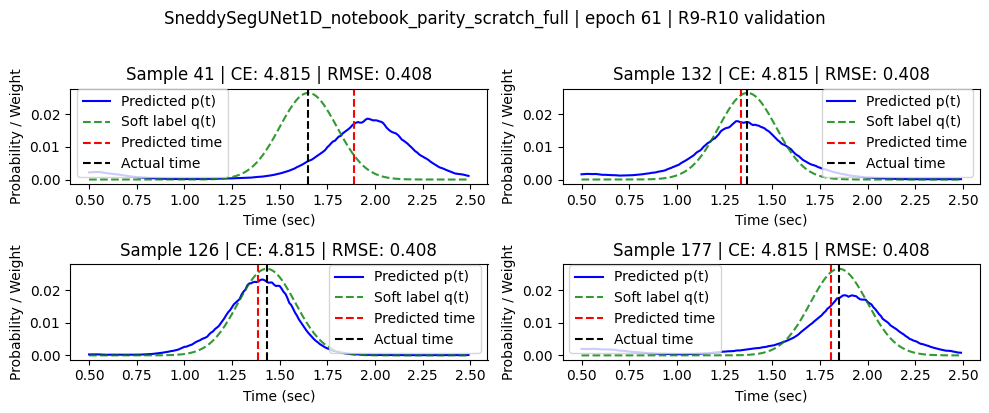

No validation improvement for 7/20 epochs.
Epoch 62/100: 

Epoch 62 [38/38] Loss 6.0364 CE 4.9198 RMSE 0.3722 KL 0.0000 WASS 0.0000 NRMSE 0.8901: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8901 Total loss: 227.6994 Total CE: 186.5511 Total RMSE: 13.7161



Val [70/70] Loss 5.2131 CE 4.8064 RMSE 0.4067 NRMSE 0.9351: 100%|██████████| 70/70 [00:03<00:00, 21.24it/s]


Val NRMSE: 935.092, Val Loss: 5.245843, Val CE: 4.869986, Val RMSE: 0.375857


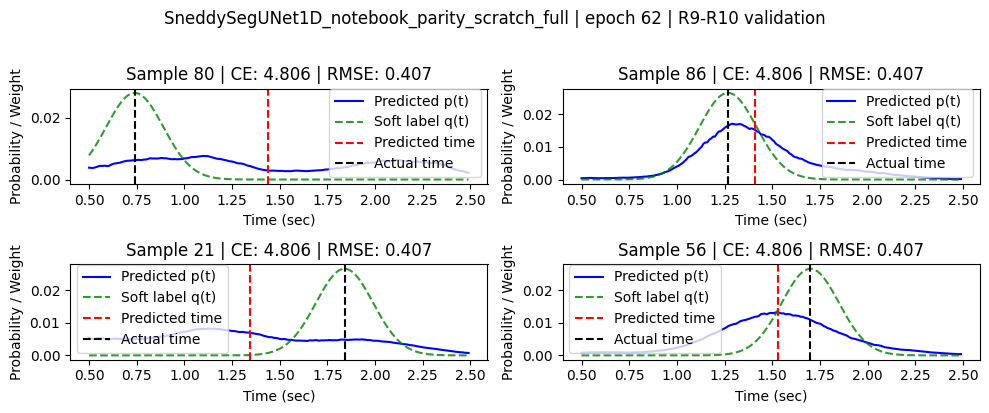

No validation improvement for 8/20 epochs.
Epoch 63/100: 

Epoch 63 [38/38] Loss 5.9500 CE 4.8991 RMSE 0.3503 KL 0.0000 WASS 0.0000 NRMSE 0.8906: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8906 Total loss: 227.7774 Total CE: 186.5380 Total RMSE: 13.7465



Val [70/70] Loss 5.2170 CE 4.8097 RMSE 0.4074 NRMSE 0.9415: 100%|██████████| 70/70 [00:03<00:00, 20.65it/s]


Val NRMSE: 941.548, Val Loss: 5.255413, Val CE: 4.876611, Val RMSE: 0.378801


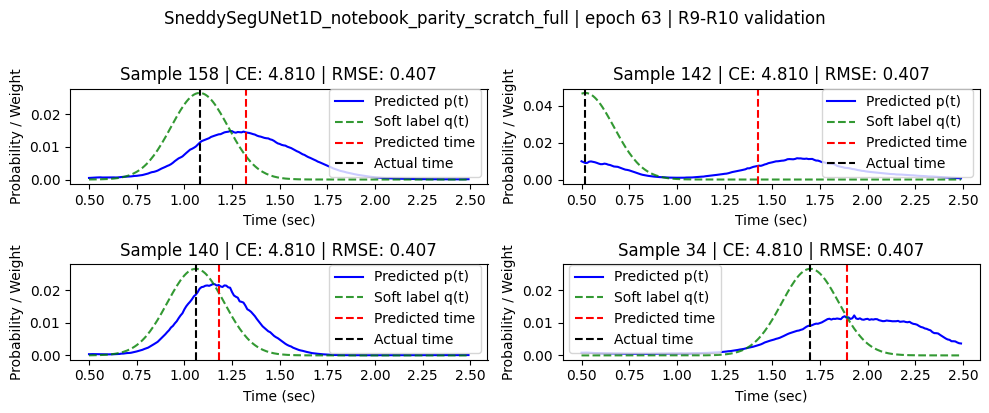

No validation improvement for 9/20 epochs.
Epoch 64/100: 

Epoch 64 [38/38] Loss 5.9303 CE 4.8879 RMSE 0.3475 KL 0.0000 WASS 0.0000 NRMSE 0.8854: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8854 Total loss: 227.1816 Total CE: 186.2826 Total RMSE: 13.6330



Val [70/70] Loss 5.2333 CE 4.8208 RMSE 0.4125 NRMSE 0.9396: 100%|██████████| 70/70 [00:03<00:00, 20.95it/s]


Val NRMSE: 939.630, Val Loss: 5.249316, Val CE: 4.871415, Val RMSE: 0.377901


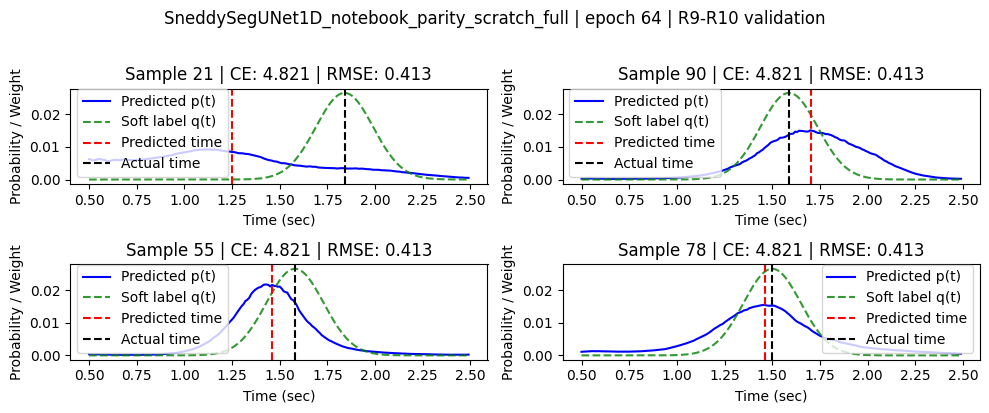

No validation improvement for 10/20 epochs.
Epoch 65/100: 

Epoch 65 [38/38] Loss 5.9933 CE 4.9072 RMSE 0.3620 KL 0.0000 WASS 0.0000 NRMSE 0.8820: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8820 Total loss: 227.0152 Total CE: 186.1470 Total RMSE: 13.6227



Val [70/70] Loss 5.2106 CE 4.8014 RMSE 0.4092 NRMSE 0.9459: 100%|██████████| 70/70 [00:03<00:00, 20.93it/s]


Val NRMSE: 945.884, Val Loss: 5.261677, Val CE: 4.880432, Val RMSE: 0.381245


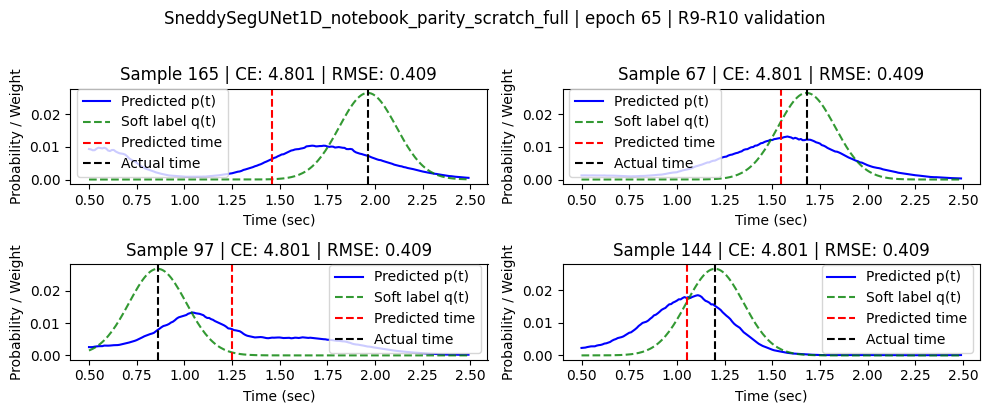

No validation improvement for 11/20 epochs.
Epoch 66/100: 

Epoch 66 [38/38] Loss 5.9348 CE 4.8934 RMSE 0.3471 KL 0.0000 WASS 0.0000 NRMSE 0.8825: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8825 Total loss: 227.0576 Total CE: 186.2110 Total RMSE: 13.6155



Val [70/70] Loss 5.2159 CE 4.8082 RMSE 0.4077 NRMSE 0.9463: 100%|██████████| 70/70 [00:03<00:00, 20.80it/s]


Val NRMSE: 946.288, Val Loss: 5.265544, Val CE: 4.884421, Val RMSE: 0.381123


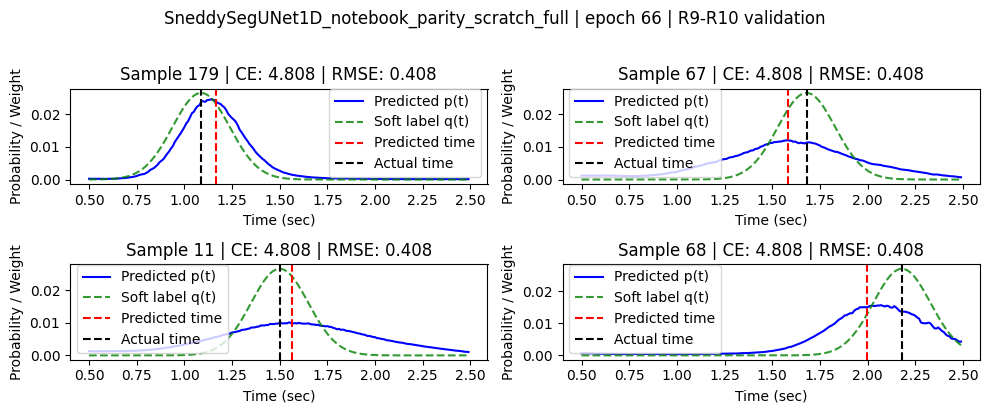

No validation improvement for 12/20 epochs.
Epoch 67/100: 

Epoch 67 [38/38] Loss 5.9308 CE 4.8849 RMSE 0.3487 KL 0.0000 WASS 0.0000 NRMSE 0.8804: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8804 Total loss: 226.8909 Total CE: 186.1407 Total RMSE: 13.5834



Val [70/70] Loss 5.2241 CE 4.8167 RMSE 0.4075 NRMSE 0.9432: 100%|██████████| 70/70 [00:03<00:00, 20.96it/s]


Val NRMSE: 943.180, Val Loss: 5.259413, Val CE: 4.879648, Val RMSE: 0.379765


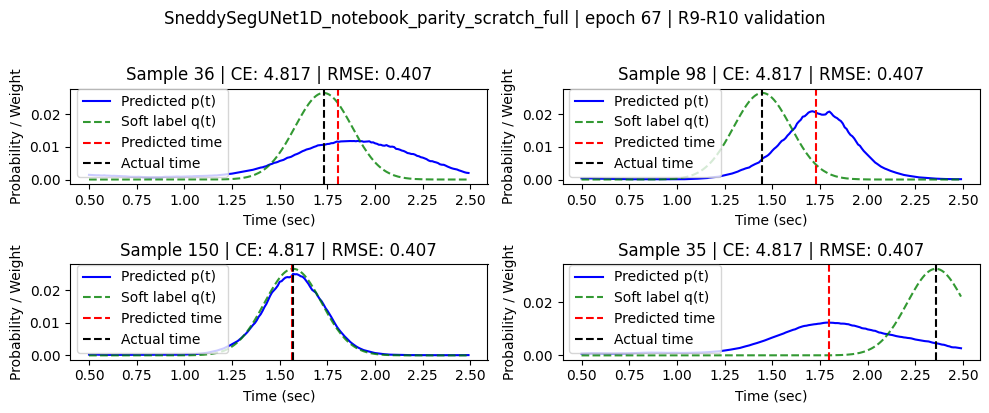

No validation improvement for 13/20 epochs.
Epoch 68/100: 

Epoch 68 [38/38] Loss 6.0329 CE 4.9387 RMSE 0.3647 KL 0.0000 WASS 0.0000 NRMSE 0.8778: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8778 Total loss: 226.7801 Total CE: 186.1044 Total RMSE: 13.5586



Val [70/70] Loss 5.2242 CE 4.8155 RMSE 0.4087 NRMSE 0.9427: 100%|██████████| 70/70 [00:03<00:00, 20.92it/s]


Val NRMSE: 942.729, Val Loss: 5.259562, Val CE: 4.880145, Val RMSE: 0.379417


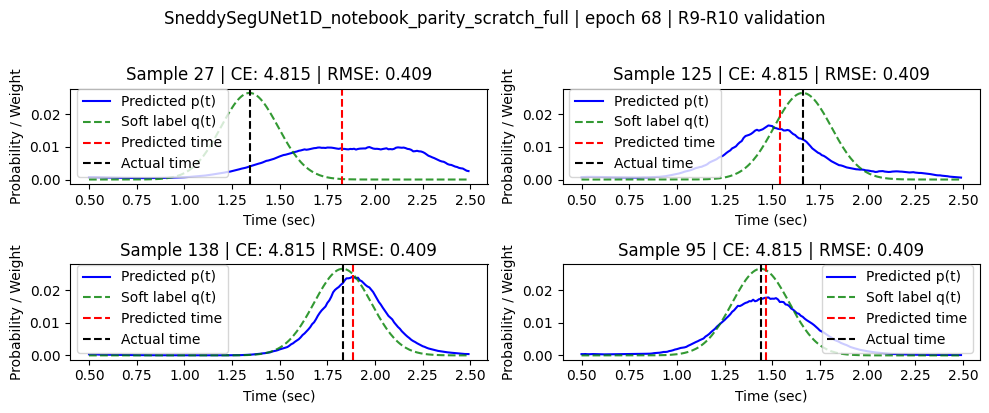

No validation improvement for 14/20 epochs.
Epoch 69/100: 

Epoch 69 [38/38] Loss 6.0399 CE 4.9373 RMSE 0.3675 KL 0.0000 WASS 0.0000 NRMSE 0.8768: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8768 Total loss: 226.6427 Total CE: 186.0452 Total RMSE: 13.5325



Val [70/70] Loss 5.1984 CE 4.7947 RMSE 0.4036 NRMSE 0.9491: 100%|██████████| 70/70 [00:03<00:00, 20.92it/s]


Val NRMSE: 949.080, Val Loss: 5.269466, Val CE: 4.886647, Val RMSE: 0.382819


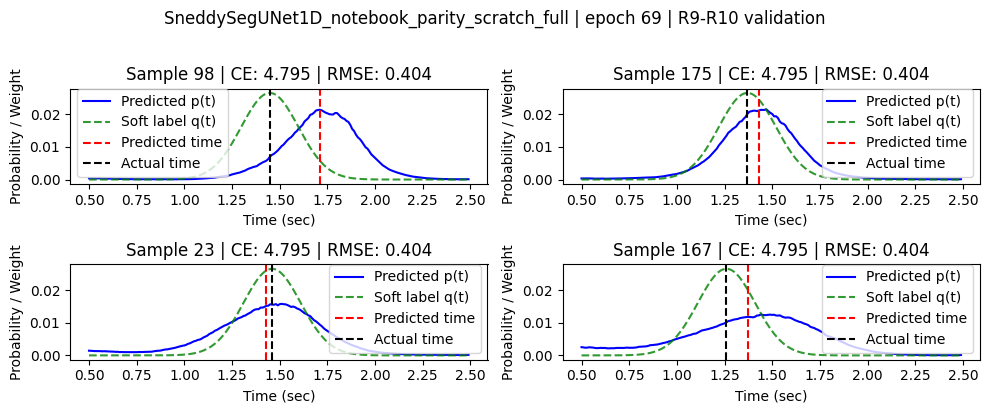

No validation improvement for 15/20 epochs.
Epoch 70/100: 

Epoch 70 [38/38] Loss 6.0470 CE 4.9191 RMSE 0.3760 KL 0.0000 WASS 0.0000 NRMSE 0.8776: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8776 Total loss: 226.7834 Total CE: 186.0544 Total RMSE: 13.5764



Val [70/70] Loss 5.1984 CE 4.7944 RMSE 0.4040 NRMSE 0.9442: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 944.238, Val Loss: 5.259776, Val CE: 4.879742, Val RMSE: 0.380034


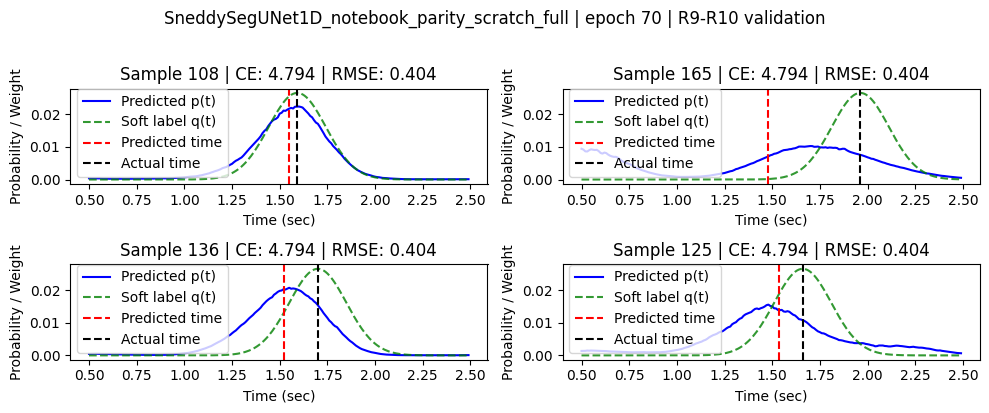

No validation improvement for 16/20 epochs.
Epoch 71/100: 

Epoch 71 [38/38] Loss 6.0687 CE 4.9582 RMSE 0.3702 KL 0.0000 WASS 0.0000 NRMSE 0.8787: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8787 Total loss: 226.8367 Total CE: 186.1445 Total RMSE: 13.5641



Val [70/70] Loss 5.2107 CE 4.8034 RMSE 0.4073 NRMSE 0.9460: 100%|██████████| 70/70 [00:03<00:00, 20.99it/s]


Val NRMSE: 945.972, Val Loss: 5.264366, Val CE: 4.883328, Val RMSE: 0.381038


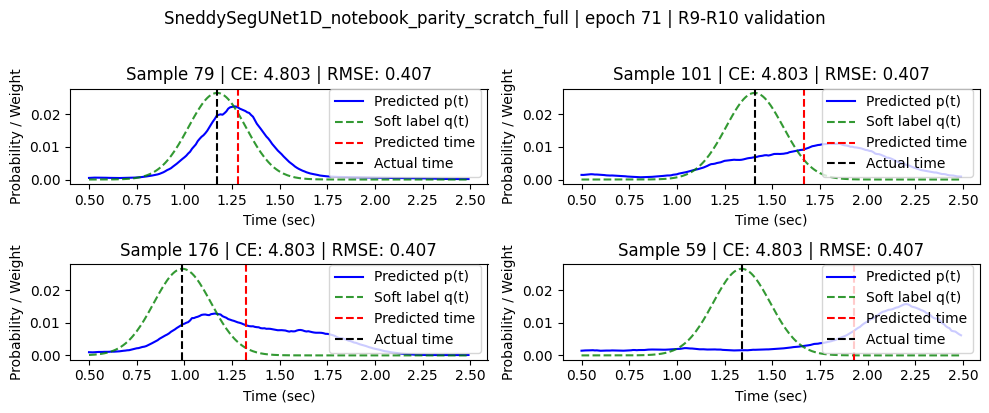

No validation improvement for 17/20 epochs.
Epoch 72/100: 

Epoch 72 [38/38] Loss 5.9069 CE 4.8855 RMSE 0.3405 KL 0.0000 WASS 0.0000 NRMSE 0.8755: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8755 Total loss: 226.4636 Total CE: 185.9909 Total RMSE: 13.4909



Val [70/70] Loss 5.2269 CE 4.8182 RMSE 0.4087 NRMSE 0.9501: 100%|██████████| 70/70 [00:03<00:00, 20.87it/s]


Val NRMSE: 950.113, Val Loss: 5.266157, Val CE: 4.883823, Val RMSE: 0.382335


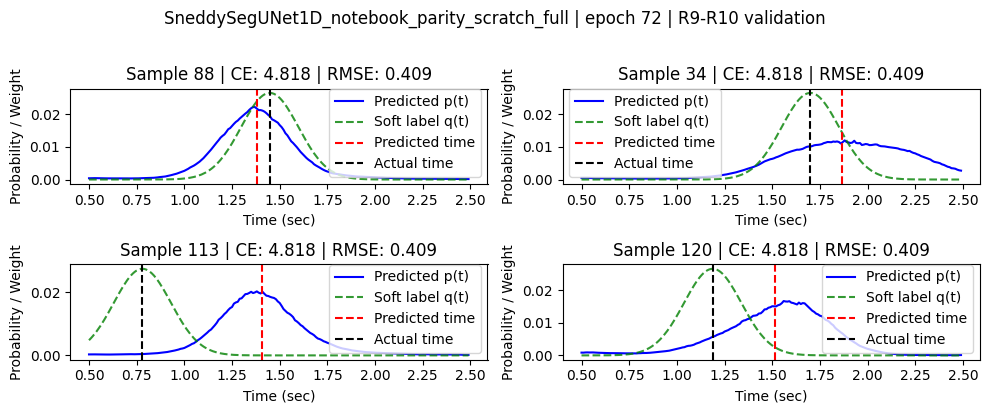

No validation improvement for 18/20 epochs.
Epoch 73/100: 

Epoch 73 [38/38] Loss 6.0069 CE 4.9063 RMSE 0.3668 KL 0.0000 WASS 0.0000 NRMSE 0.8776: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8776 Total loss: 226.7656 Total CE: 186.0889 Total RMSE: 13.5589



Val [70/70] Loss 5.2250 CE 4.8129 RMSE 0.4121 NRMSE 0.9525: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 952.476, Val Loss: 5.272589, Val CE: 4.888231, Val RMSE: 0.384358


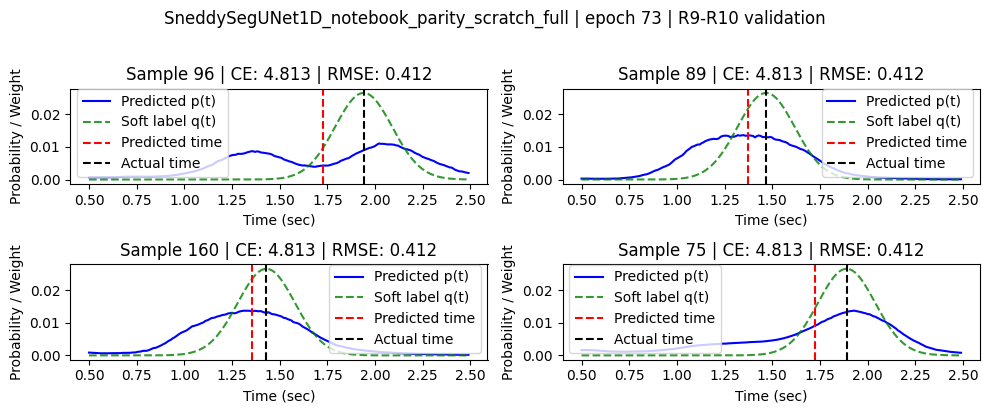

No validation improvement for 19/20 epochs.
Epoch 74/100: 

Epoch 74 [38/38] Loss 5.9557 CE 4.9015 RMSE 0.3514 KL 0.0000 WASS 0.0000 NRMSE 0.8692: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8692 Total loss: 226.0157 Total CE: 185.7309 Total RMSE: 13.4283



Val [70/70] Loss 5.2324 CE 4.8198 RMSE 0.4126 NRMSE 0.9526: 100%|██████████| 70/70 [00:03<00:00, 20.95it/s]


Val NRMSE: 952.568, Val Loss: 5.275803, Val CE: 4.891087, Val RMSE: 0.384716


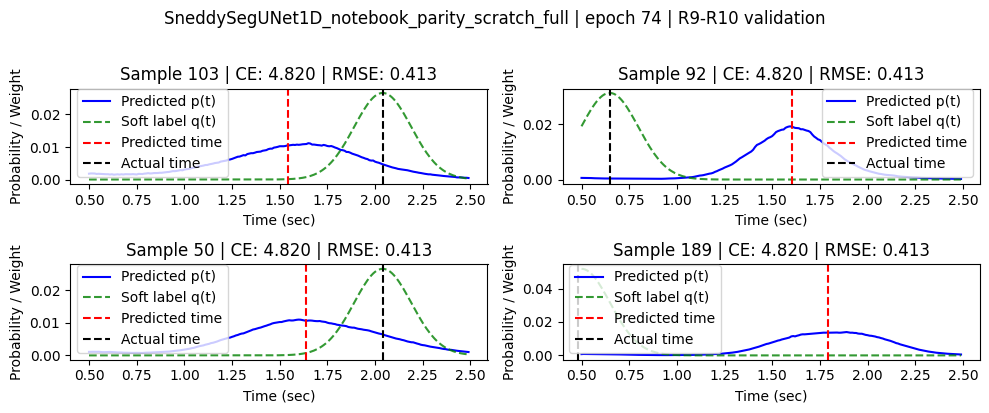

No validation improvement for 20/20 epochs.
Restart from checkpoint /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640/best_model.pth. Best Val NRMSE: 933.253626 at epoch 14.
Updating learning rate 0.00025 -> 0.000125
Epoch 75/100: 

Epoch 75 [38/38] Loss 6.0788 CE 4.9415 RMSE 0.3791 KL 0.0000 WASS 0.0000 NRMSE 0.9006: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.9006 Total loss: 228.7440 Total CE: 186.9689 Total RMSE: 13.9251



Val [70/70] Loss 5.1861 CE 4.7847 RMSE 0.4015 NRMSE 0.9366: 100%|██████████| 70/70 [00:03<00:00, 20.81it/s]


Val NRMSE: 936.617, Val Loss: 5.246859, Val CE: 4.869986, Val RMSE: 0.376873


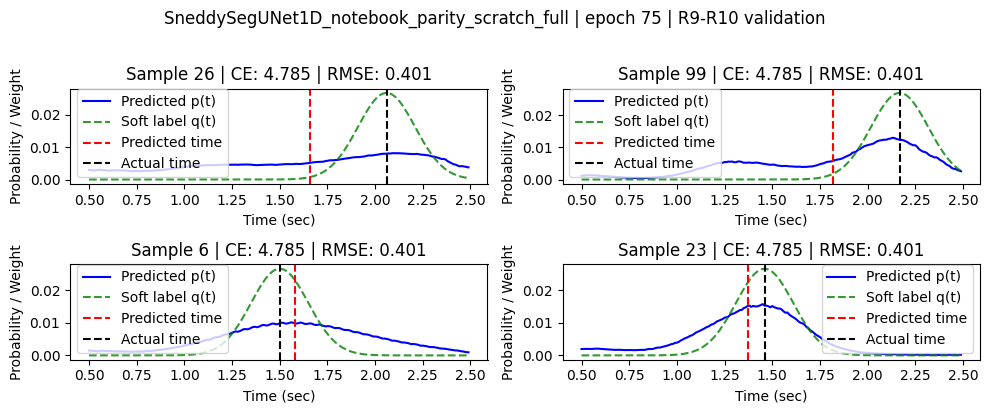

No validation improvement for 1/20 epochs.
Epoch 76/100: 

Epoch 76 [38/38] Loss 5.9726 CE 4.8841 RMSE 0.3628 KL 0.0000 WASS 0.0000 NRMSE 0.8993: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8993 Total loss: 228.5207 Total CE: 186.8830 Total RMSE: 13.8792



Val [70/70] Loss 5.1825 CE 4.7832 RMSE 0.3993 NRMSE 0.9373: 100%|██████████| 70/70 [00:03<00:00, 20.95it/s]


Val NRMSE: 937.329, Val Loss: 5.249197, Val CE: 4.872016, Val RMSE: 0.377181


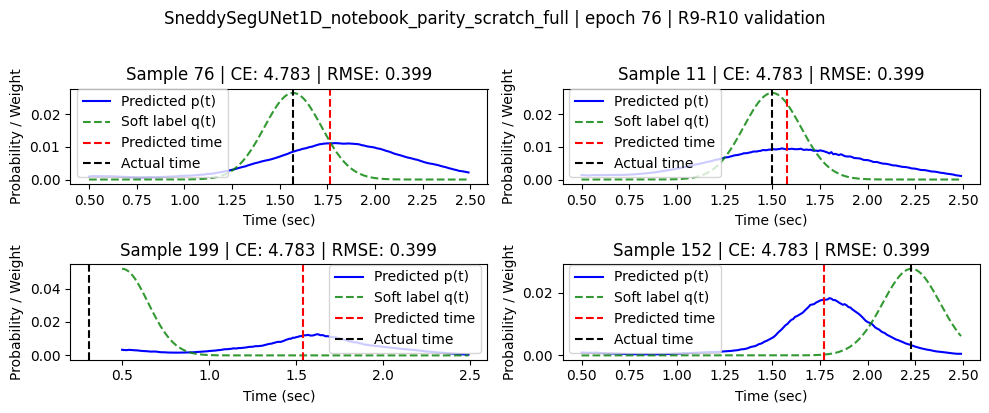

No validation improvement for 2/20 epochs.
Epoch 77/100: 

Epoch 77 [38/38] Loss 6.1040 CE 4.9627 RMSE 0.3804 KL 0.0000 WASS 0.0000 NRMSE 0.8979: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8979 Total loss: 228.4806 Total CE: 186.8681 Total RMSE: 13.8708



Val [70/70] Loss 5.1771 CE 4.7797 RMSE 0.3974 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 20.73it/s]


Val NRMSE: 934.461, Val Loss: 5.243163, Val CE: 4.867500, Val RMSE: 0.375663


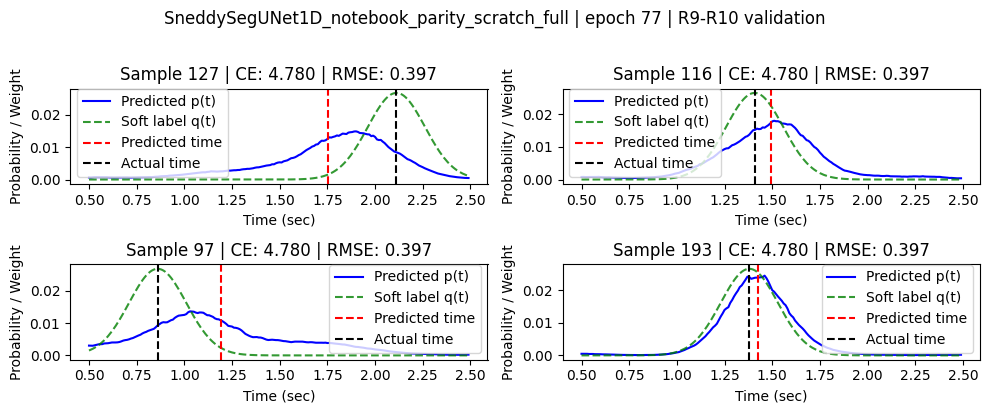

No validation improvement for 3/20 epochs.
Epoch 78/100: 

Epoch 78 [38/38] Loss 6.0588 CE 4.9383 RMSE 0.3735 KL 0.0000 WASS 0.0000 NRMSE 0.8976: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8976 Total loss: 228.3025 Total CE: 186.7486 Total RMSE: 13.8513



Val [70/70] Loss 5.1953 CE 4.7910 RMSE 0.4043 NRMSE 0.9338: 100%|██████████| 70/70 [00:03<00:00, 21.03it/s]


Val NRMSE: 933.775, Val Loss: 5.238785, Val CE: 4.863370, Val RMSE: 0.375414


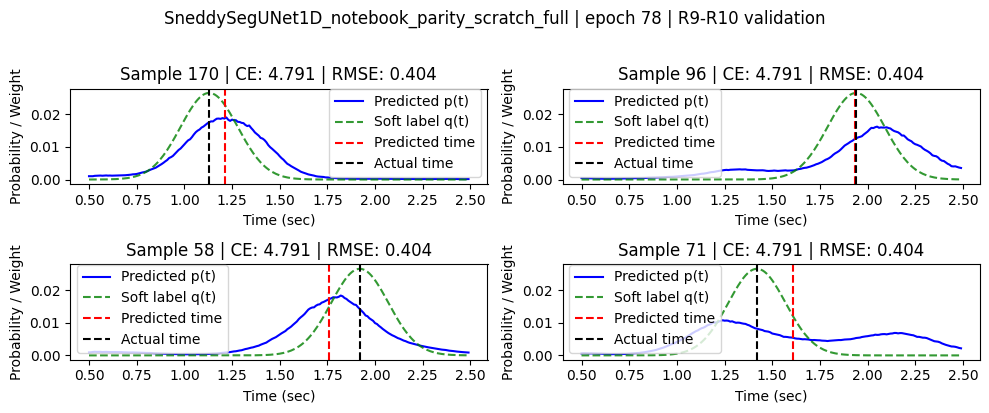

No validation improvement for 4/20 epochs.
Epoch 79/100: 

Epoch 79 [38/38] Loss 6.1056 CE 4.9519 RMSE 0.3846 KL 0.0000 WASS 0.0000 NRMSE 0.8984: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8984 Total loss: 228.5429 Total CE: 186.8596 Total RMSE: 13.8944



Val [70/70] Loss 5.1859 CE 4.7828 RMSE 0.4031 NRMSE 0.9408: 100%|██████████| 70/70 [00:03<00:00, 21.02it/s]


Val NRMSE: 940.831, Val Loss: 5.254262, Val CE: 4.875234, Val RMSE: 0.379028


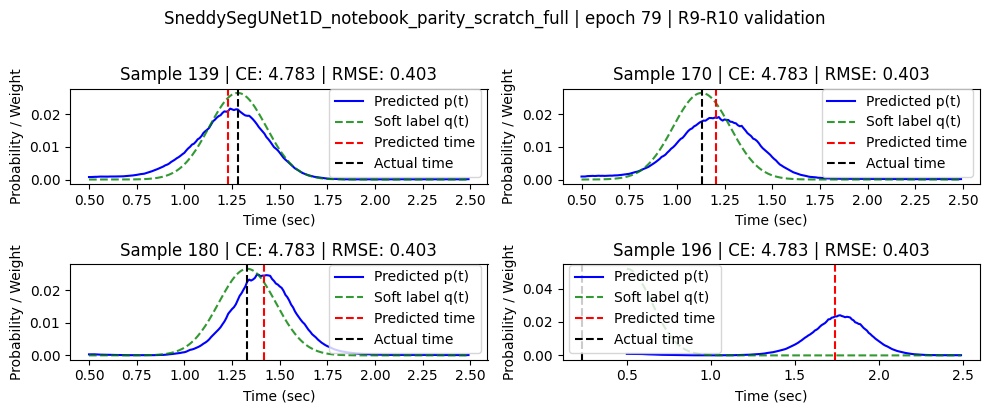

No validation improvement for 5/20 epochs.
Epoch 80/100: 

Epoch 80 [38/38] Loss 5.8837 CE 4.8768 RMSE 0.3356 KL 0.0000 WASS 0.0000 NRMSE 0.8948: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8948 Total loss: 228.0977 Total CE: 186.6924 Total RMSE: 13.8018



Val [70/70] Loss 5.1772 CE 4.7790 RMSE 0.3982 NRMSE 0.9377: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 937.712, Val Loss: 5.251909, Val CE: 4.875006, Val RMSE: 0.376903


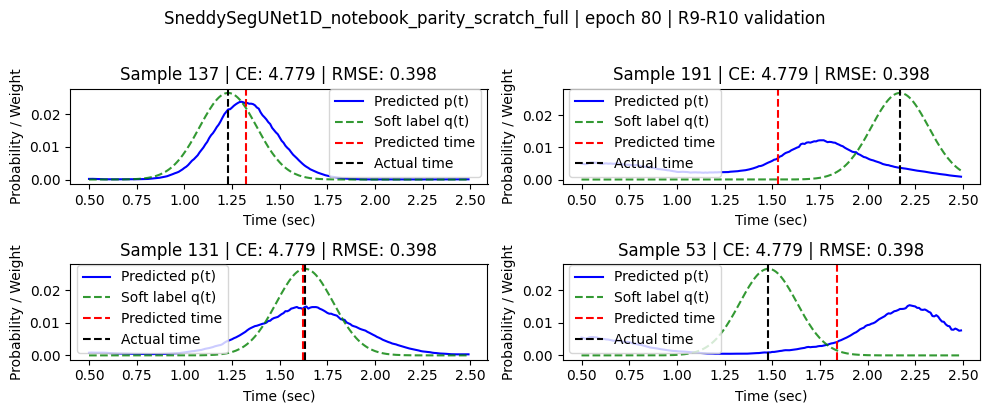

No validation improvement for 6/20 epochs.
Epoch 81/100: 

Epoch 81 [38/38] Loss 6.0404 CE 4.9402 RMSE 0.3667 KL 0.0000 WASS 0.0000 NRMSE 0.8924: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8924 Total loss: 227.8991 Total CE: 186.5412 Total RMSE: 13.7860



Val [70/70] Loss 5.1868 CE 4.7853 RMSE 0.4014 NRMSE 0.9381: 100%|██████████| 70/70 [00:03<00:00, 20.82it/s]


Val NRMSE: 938.140, Val Loss: 5.248074, Val CE: 4.870769, Val RMSE: 0.377305


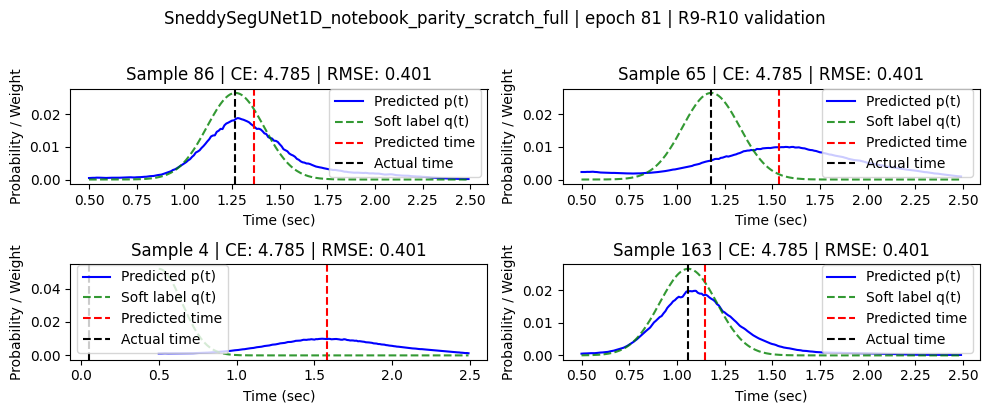

No validation improvement for 7/20 epochs.
Epoch 82/100: 

Epoch 82 [38/38] Loss 5.9109 CE 4.8721 RMSE 0.3462 KL 0.0000 WASS 0.0000 NRMSE 0.8912: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8912 Total loss: 227.7947 Total CE: 186.5435 Total RMSE: 13.7504



Val [70/70] Loss 5.1991 CE 4.7943 RMSE 0.4048 NRMSE 0.9408: 100%|██████████| 70/70 [00:03<00:00, 20.92it/s]


Val NRMSE: 940.808, Val Loss: 5.252159, Val CE: 4.873283, Val RMSE: 0.378876


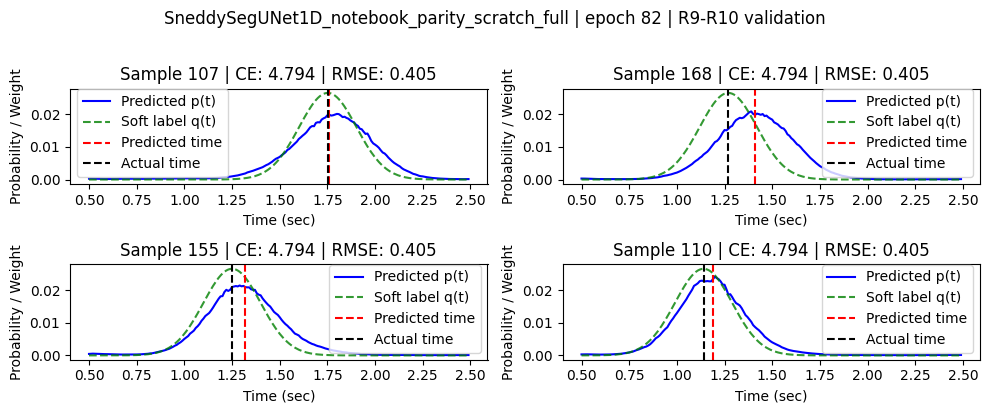

No validation improvement for 8/20 epochs.
Epoch 83/100: 

Epoch 83 [38/38] Loss 6.0425 CE 4.9237 RMSE 0.3729 KL 0.0000 WASS 0.0000 NRMSE 0.8905: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8905 Total loss: 227.8200 Total CE: 186.5333 Total RMSE: 13.7623



Val [70/70] Loss 5.1950 CE 4.7910 RMSE 0.4040 NRMSE 0.9371: 100%|██████████| 70/70 [00:03<00:00, 20.96it/s]


Val NRMSE: 937.086, Val Loss: 5.245198, Val CE: 4.868625, Val RMSE: 0.376573


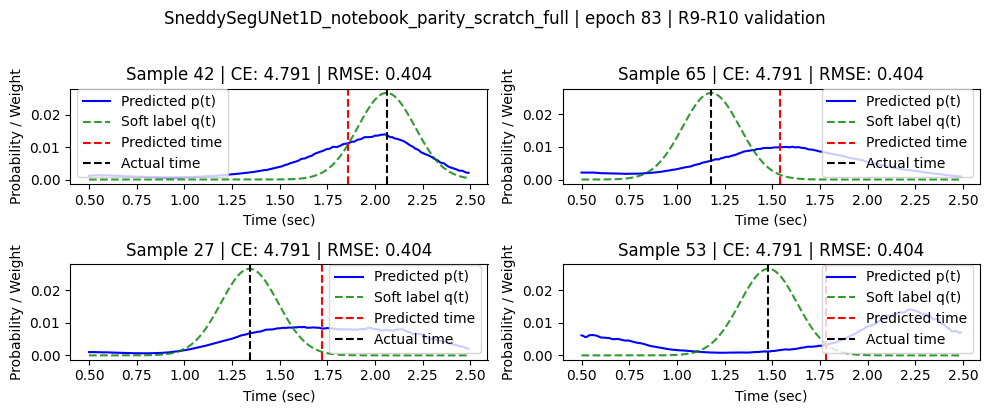

No validation improvement for 9/20 epochs.
Epoch 84/100: 

Epoch 84 [38/38] Loss 5.9315 CE 4.8970 RMSE 0.3448 KL 0.0000 WASS 0.0000 NRMSE 0.8887: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8887 Total loss: 227.5929 Total CE: 186.4199 Total RMSE: 13.7243



Val [70/70] Loss 5.1957 CE 4.7895 RMSE 0.4062 NRMSE 0.9428: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 942.825, Val Loss: 5.257882, Val CE: 4.878088, Val RMSE: 0.379794


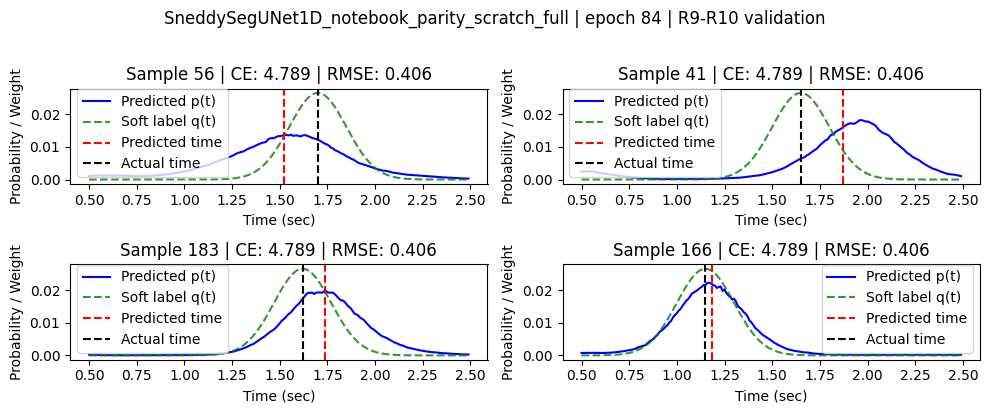

No validation improvement for 10/20 epochs.
Epoch 85/100: 

Epoch 85 [38/38] Loss 6.0030 CE 4.9116 RMSE 0.3638 KL 0.0000 WASS 0.0000 NRMSE 0.8904: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8904 Total loss: 227.7091 Total CE: 186.5032 Total RMSE: 13.7353



Val [70/70] Loss 5.1885 CE 4.7875 RMSE 0.4009 NRMSE 0.9393: 100%|██████████| 70/70 [00:03<00:00, 20.92it/s]


Val NRMSE: 939.336, Val Loss: 5.252604, Val CE: 4.874762, Val RMSE: 0.377841


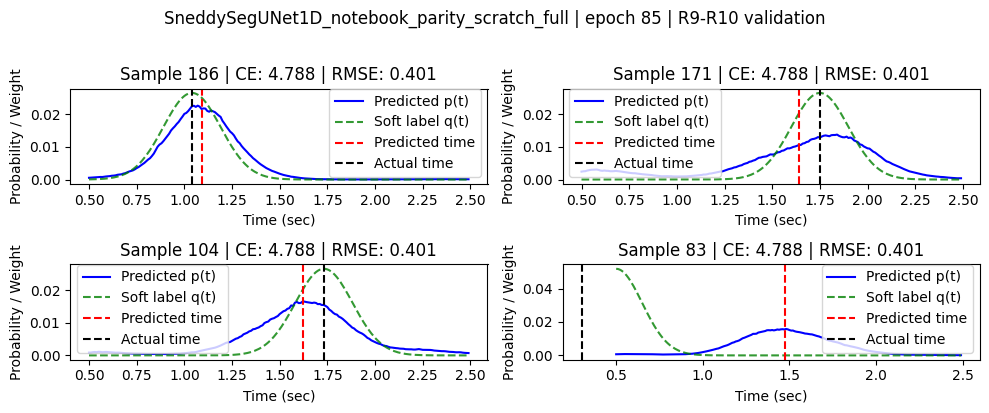

No validation improvement for 11/20 epochs.
Epoch 86/100: 

Epoch 86 [38/38] Loss 5.9849 CE 4.8975 RMSE 0.3625 KL 0.0000 WASS 0.0000 NRMSE 0.8889: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8889 Total loss: 227.5787 Total CE: 186.4284 Total RMSE: 13.7168



Val [70/70] Loss 5.1870 CE 4.7855 RMSE 0.4016 NRMSE 0.9407: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 940.688, Val Loss: 5.252586, Val CE: 4.873868, Val RMSE: 0.378718


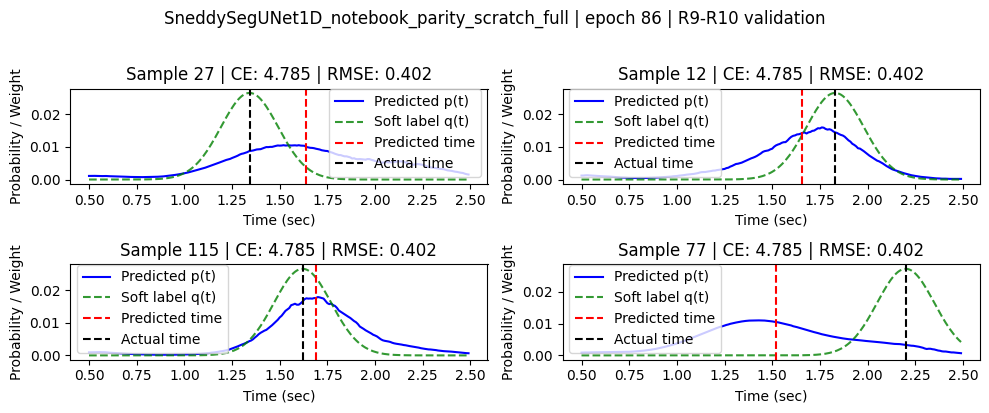

No validation improvement for 12/20 epochs.
Epoch 87/100: 

Epoch 87 [38/38] Loss 5.9939 CE 4.8947 RMSE 0.3664 KL 0.0000 WASS 0.0000 NRMSE 0.8898: 100%|██████████| 38/38 [00:50<00:00,  1.32s/it]

NRMSE: 0.8898 Total loss: 227.6755 Total CE: 186.4595 Total RMSE: 13.7387



Val [70/70] Loss 5.1983 CE 4.7924 RMSE 0.4059 NRMSE 0.9382: 100%|██████████| 70/70 [00:03<00:00, 20.59it/s]


Val NRMSE: 938.235, Val Loss: 5.249372, Val CE: 4.871919, Val RMSE: 0.377453


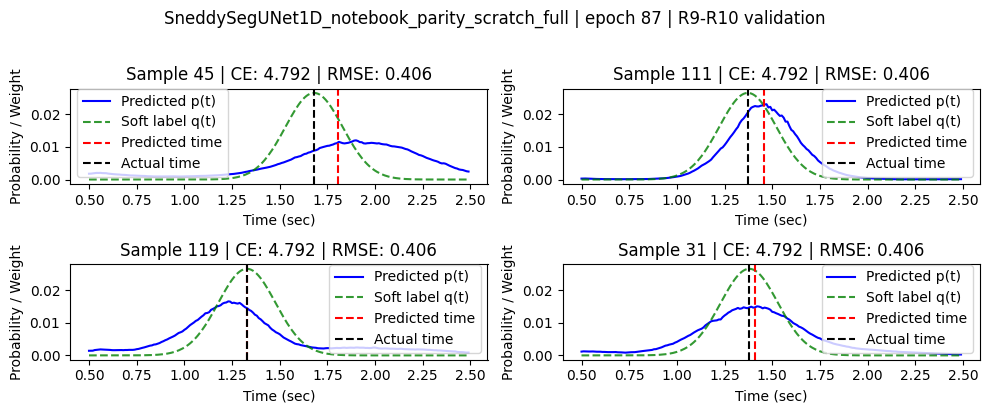

No validation improvement for 13/20 epochs.
Epoch 88/100: 

Epoch 88 [38/38] Loss 5.9673 CE 4.8979 RMSE 0.3564 KL 0.0000 WASS 0.0000 NRMSE 0.8846: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8846 Total loss: 227.3220 Total CE: 186.2910 Total RMSE: 13.6770



Val [70/70] Loss 5.2003 CE 4.7964 RMSE 0.4039 NRMSE 0.9412: 100%|██████████| 70/70 [00:03<00:00, 20.41it/s]


Val NRMSE: 941.204, Val Loss: 5.254102, Val CE: 4.875199, Val RMSE: 0.378903


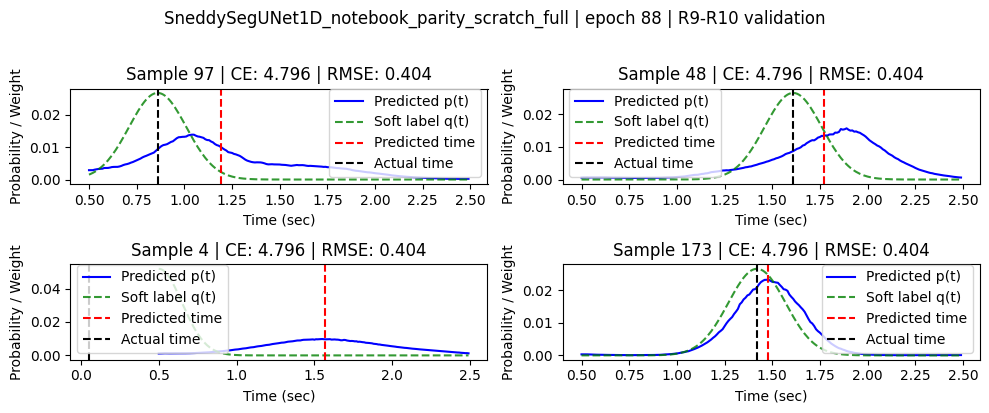

No validation improvement for 14/20 epochs.
Epoch 89/100: 

Epoch 89 [38/38] Loss 5.9284 CE 4.8893 RMSE 0.3464 KL 0.0000 WASS 0.0000 NRMSE 0.8865: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8865 Total loss: 227.3437 Total CE: 186.3073 Total RMSE: 13.6788



Val [70/70] Loss 5.1975 CE 4.7927 RMSE 0.4048 NRMSE 0.9448: 100%|██████████| 70/70 [00:03<00:00, 20.67it/s]


Val NRMSE: 944.787, Val Loss: 5.260076, Val CE: 4.879470, Val RMSE: 0.380607


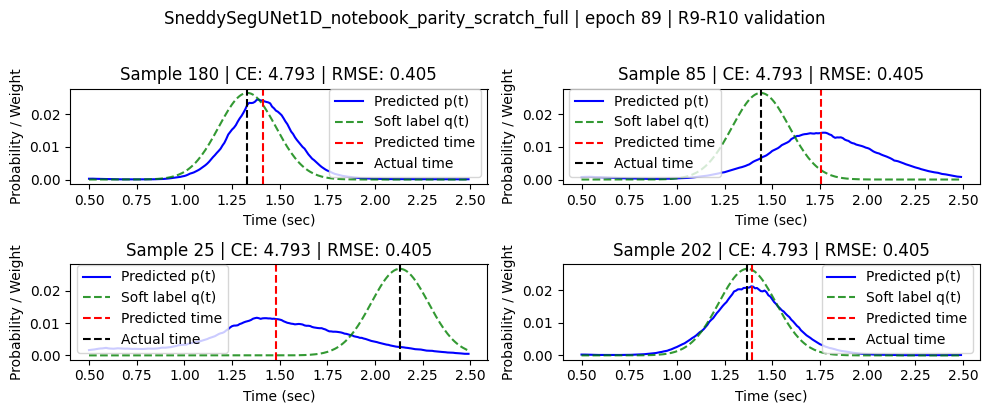

No validation improvement for 15/20 epochs.
Epoch 90/100: 

Epoch 90 [38/38] Loss 5.9034 CE 4.8820 RMSE 0.3405 KL 0.0000 WASS 0.0000 NRMSE 0.8851: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8851 Total loss: 227.2284 Total CE: 186.3080 Total RMSE: 13.6401



Val [70/70] Loss 5.2016 CE 4.7949 RMSE 0.4067 NRMSE 0.9438: 100%|██████████| 70/70 [00:03<00:00, 20.67it/s]


Val NRMSE: 943.766, Val Loss: 5.257567, Val CE: 4.877119, Val RMSE: 0.380448


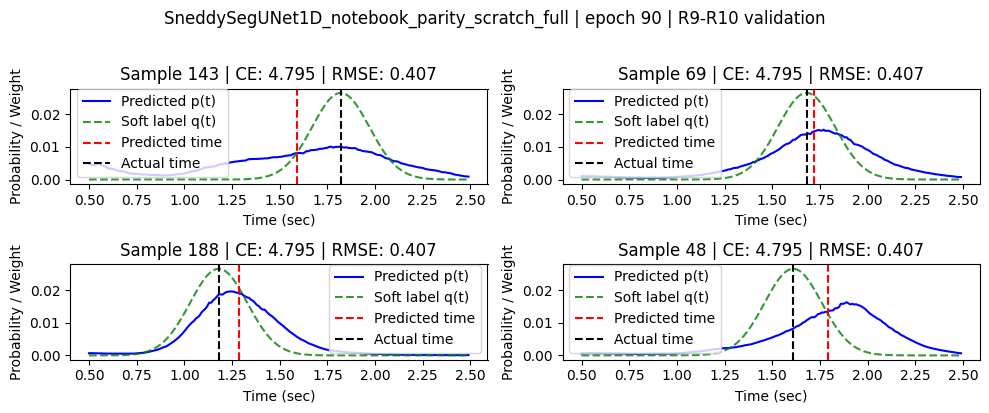

No validation improvement for 16/20 epochs.
Epoch 91/100: 

Epoch 91 [38/38] Loss 6.0041 CE 4.9173 RMSE 0.3623 KL 0.0000 WASS 0.0000 NRMSE 0.8828: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8828 Total loss: 227.1390 Total CE: 186.1926 Total RMSE: 13.6488



Val [70/70] Loss 5.1938 CE 4.7892 RMSE 0.4046 NRMSE 0.9449: 100%|██████████| 70/70 [00:03<00:00, 20.53it/s]


Val NRMSE: 944.889, Val Loss: 5.263745, Val CE: 4.883102, Val RMSE: 0.380644


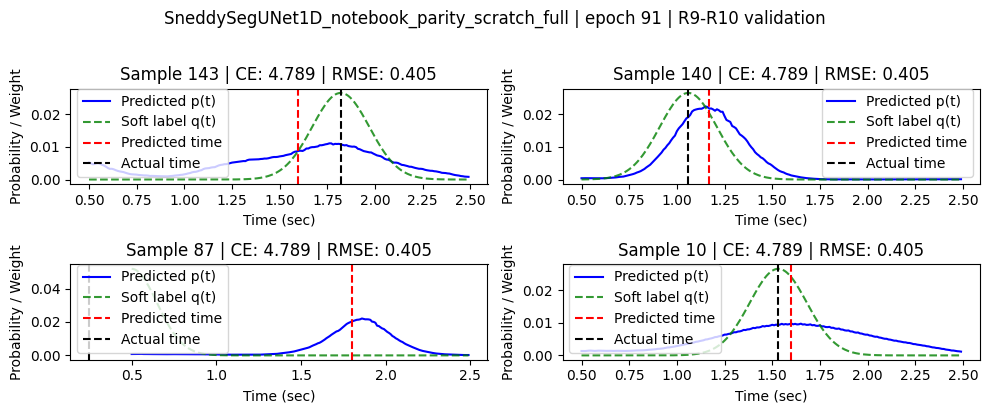

No validation improvement for 17/20 epochs.
Epoch 92/100: 

Epoch 92 [38/38] Loss 5.9585 CE 4.8913 RMSE 0.3557 KL 0.0000 WASS 0.0000 NRMSE 0.8802: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8802 Total loss: 226.8089 Total CE: 186.0524 Total RMSE: 13.5855



Val [70/70] Loss 5.2073 CE 4.8019 RMSE 0.4054 NRMSE 0.9499: 100%|██████████| 70/70 [00:03<00:00, 20.62it/s]


Val NRMSE: 949.894, Val Loss: 5.272444, Val CE: 4.889174, Val RMSE: 0.383270


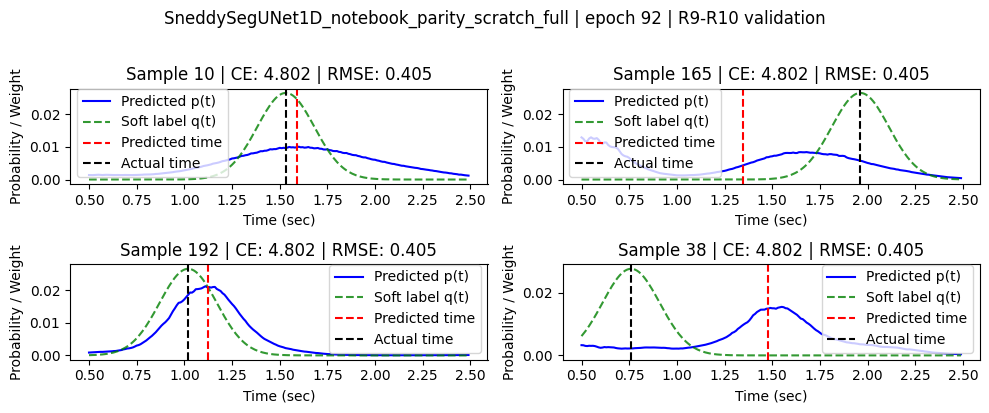

No validation improvement for 18/20 epochs.
Epoch 93/100: 

Epoch 93 [38/38] Loss 6.0529 CE 4.9560 RMSE 0.3656 KL 0.0000 WASS 0.0000 NRMSE 0.8810: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8810 Total loss: 227.0458 Total CE: 186.2332 Total RMSE: 13.6042



Val [70/70] Loss 5.2031 CE 4.7974 RMSE 0.4057 NRMSE 0.9446: 100%|██████████| 70/70 [00:03<00:00, 20.55it/s]


Val NRMSE: 944.557, Val Loss: 5.261021, Val CE: 4.880821, Val RMSE: 0.380200


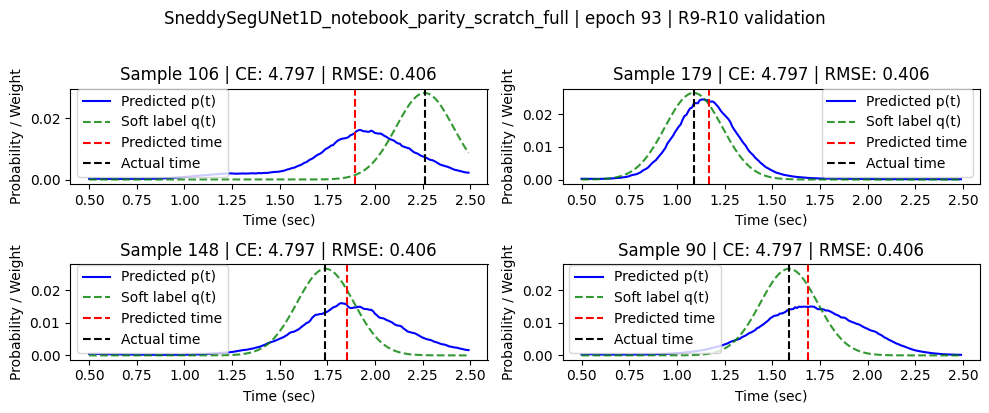

No validation improvement for 19/20 epochs.
Epoch 94/100: 

Epoch 94 [38/38] Loss 5.9268 CE 4.8720 RMSE 0.3516 KL 0.0000 WASS 0.0000 NRMSE 0.8785: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8785 Total loss: 226.7709 Total CE: 186.0560 Total RMSE: 13.5716



Val [70/70] Loss 5.2128 CE 4.8046 RMSE 0.4082 NRMSE 0.9474: 100%|██████████| 70/70 [00:03<00:00, 20.67it/s]


Val NRMSE: 947.384, Val Loss: 5.269078, Val CE: 4.887468, Val RMSE: 0.381610


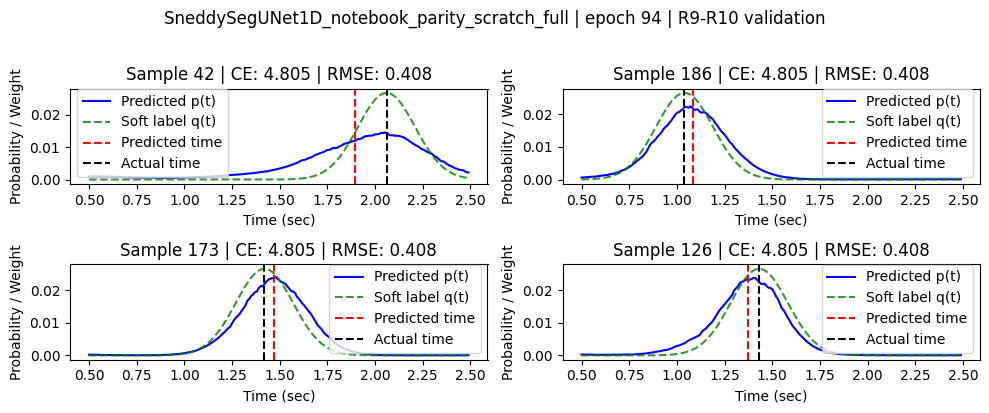

No validation improvement for 20/20 epochs.
Restart from checkpoint /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640/best_model.pth. Best Val NRMSE: 933.253626 at epoch 14.
Updating learning rate 0.000125 -> 6.25e-05
Epoch 95/100: 

Epoch 95 [38/38] Loss 6.0096 CE 4.9081 RMSE 0.3672 KL 0.0000 WASS 0.0000 NRMSE 0.9023: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.9023 Total loss: 228.7057 Total CE: 186.9245 Total RMSE: 13.9271



Val [70/70] Loss 5.1816 CE 4.7823 RMSE 0.3993 NRMSE 0.9332: 100%|██████████| 70/70 [00:03<00:00, 20.68it/s]


Val NRMSE: 933.153, Val Loss: 5.240447, Val CE: 4.865399, Val RMSE: 0.375048


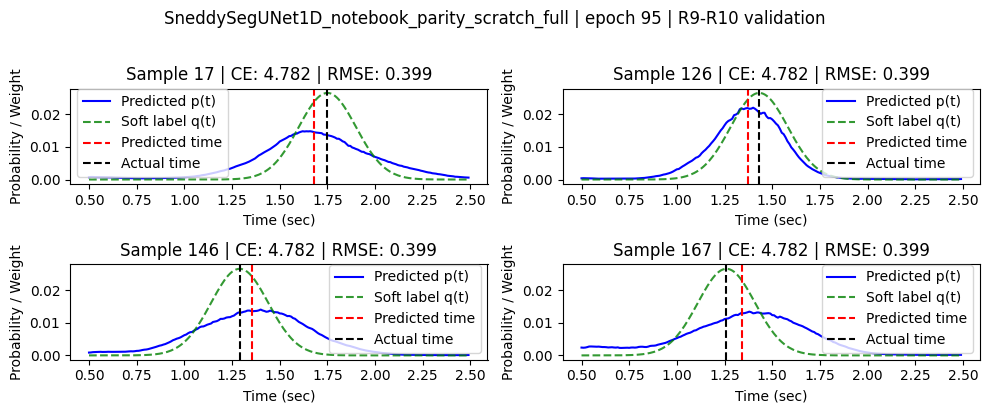

New best validation NRMSE: 933.153199 at epoch 95
Epoch 96/100: 

Epoch 96 [38/38] Loss 5.9686 CE 4.9116 RMSE 0.3523 KL 0.0000 WASS 0.0000 NRMSE 0.9012: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.9012 Total loss: 228.7551 Total CE: 186.9903 Total RMSE: 13.9216



Val [70/70] Loss 5.1837 CE 4.7844 RMSE 0.3994 NRMSE 0.9352: 100%|██████████| 70/70 [00:03<00:00, 20.33it/s]


Val NRMSE: 935.156, Val Loss: 5.245356, Val CE: 4.869526, Val RMSE: 0.375831


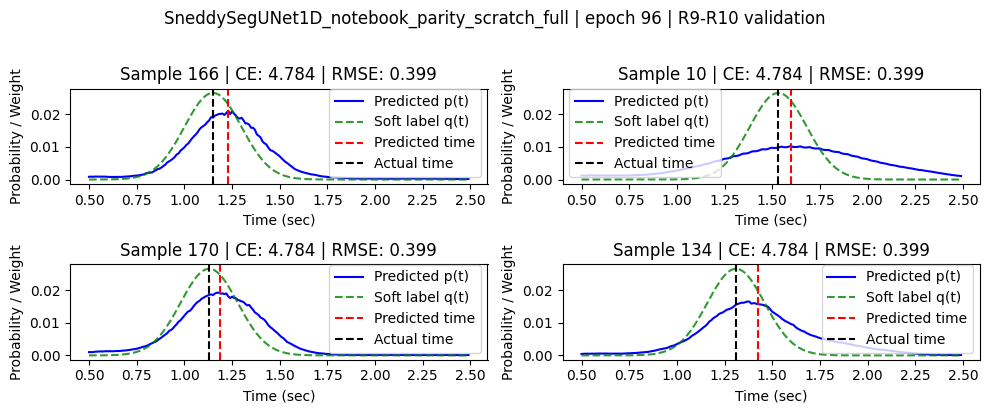

No validation improvement for 1/20 epochs.
Epoch 97/100: 

Epoch 97 [38/38] Loss 6.0683 CE 4.9360 RMSE 0.3774 KL 0.0000 WASS 0.0000 NRMSE 0.8964: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8964 Total loss: 228.4312 Total CE: 186.8263 Total RMSE: 13.8683



Val [70/70] Loss 5.1815 CE 4.7819 RMSE 0.3996 NRMSE 0.9364: 100%|██████████| 70/70 [00:03<00:00, 20.45it/s]


Val NRMSE: 936.373, Val Loss: 5.245391, Val CE: 4.868697, Val RMSE: 0.376694


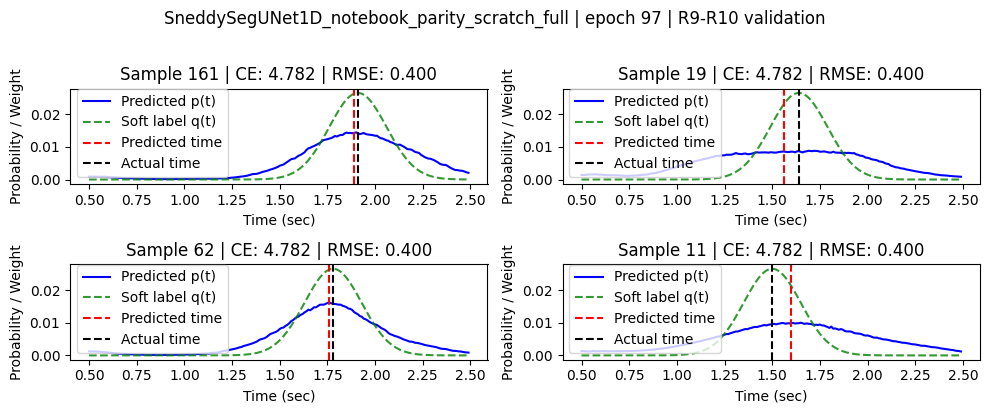

No validation improvement for 2/20 epochs.
Epoch 98/100: 

Epoch 98 [38/38] Loss 6.0281 CE 4.9175 RMSE 0.3702 KL 0.0000 WASS 0.0000 NRMSE 0.8991: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8991 Total loss: 228.4618 Total CE: 186.8357 Total RMSE: 13.8754



Val [70/70] Loss 5.1724 CE 4.7745 RMSE 0.3980 NRMSE 0.9368: 100%|██████████| 70/70 [00:03<00:00, 20.59it/s]


Val NRMSE: 936.765, Val Loss: 5.248079, Val CE: 4.871191, Val RMSE: 0.376889


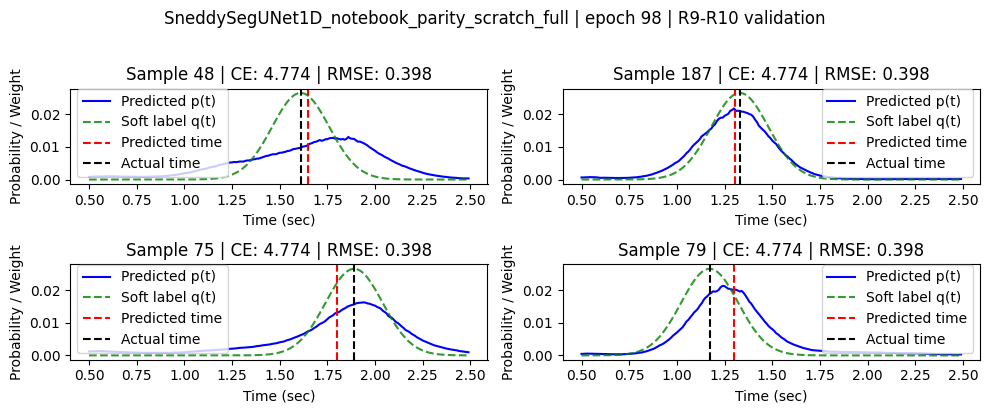

No validation improvement for 3/20 epochs.
Epoch 99/100: 

Epoch 99 [38/38] Loss 5.9440 CE 4.8948 RMSE 0.3497 KL 0.0000 WASS 0.0000 NRMSE 0.8980: 100%|██████████| 38/38 [00:47<00:00,  1.25s/it]

NRMSE: 0.8980 Total loss: 228.3317 Total CE: 186.7779 Total RMSE: 13.8512



Val [70/70] Loss 5.1838 CE 4.7821 RMSE 0.4017 NRMSE 0.9368: 100%|██████████| 70/70 [00:03<00:00, 20.81it/s]


Val NRMSE: 936.836, Val Loss: 5.246442, Val CE: 4.869470, Val RMSE: 0.376971


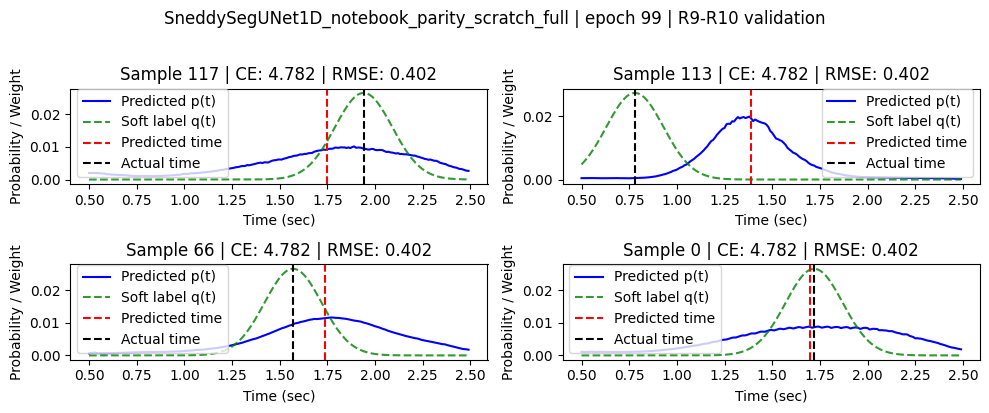

No validation improvement for 4/20 epochs.
Epoch 100/100: 

Epoch 100 [38/38] Loss 5.8999 CE 4.8784 RMSE 0.3405 KL 0.0000 WASS 0.0000 NRMSE 0.8984: 100%|██████████| 38/38 [00:47<00:00,  1.26s/it]

NRMSE: 0.8984 Total loss: 228.2674 Total CE: 186.7709 Total RMSE: 13.8322



Val [70/70] Loss 5.1852 CE 4.7846 RMSE 0.4007 NRMSE 0.9327: 100%|██████████| 70/70 [00:03<00:00, 20.26it/s]


Val NRMSE: 932.666, Val Loss: 5.239044, Val CE: 4.864402, Val RMSE: 0.374642


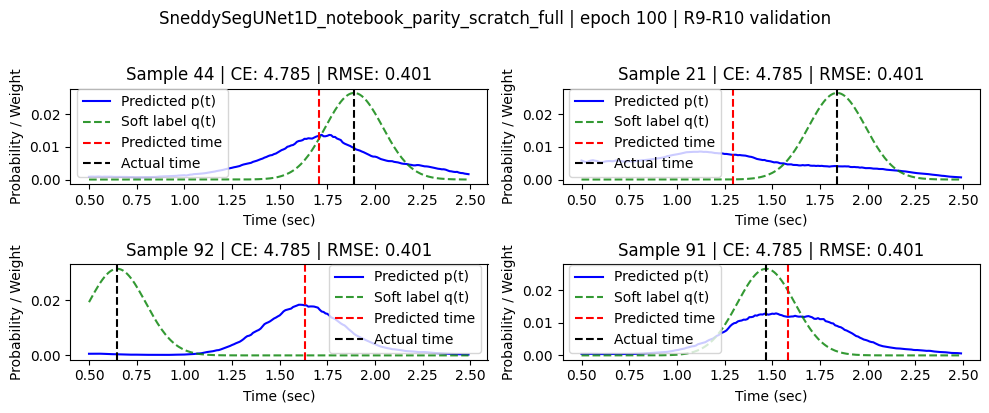

New best validation NRMSE: 932.665879 at epoch 100
Run finished. Artifacts saved in: /home/qdata/ayana_experiments/neurosned/artifacts/SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640


[{'created_at': '2026-06-19T19:26:40Z',
  'run_name': 'SneddySegUNet1D_notebook_parity_scratch_full__SneddySegUNet1D__c96_w2_d5__bs2000__lr0p001__sig0p15__tau0p65__lt3p0_ce1p0__20260619_192640',
  'experiment_group': 'SneddySegUNet1D_notebook_parity_scratch_full',
  'experiment': 'SneddySegUNet1D_notebook_parity_scratch_full',
  'model': 'SneddySegUNet1D',
  'seed': 42,
  'batch_size': 2000,
  'lr': 6.25e-05,
  'sigma': 0.15,
  'temperature': 0.65,
  'train_temperature': 0.65,
  'eval_temperature': 0.65,
  'lambda_time': 3.0,
  'lambda_ce': 1.0,
  'train_lambda_ce': 1.0,
  'best_epoch': 100,
  'best_val_nrmse': 932.6658794236429,
  'holdout_nrmse': None,
  'training_started_at': '2026-06-19T19:26:40Z',
  'training_finished_at': '2026-06-19T20:53:02Z',
  'training_wall_seconds': 5181.59271327802,
  'avg_epoch_seconds': 51.815927132780196,
  'time_to_best_seconds': 5181.556587977917,
  'holdout_seconds': None,
  'status': 'training_finished',
  'run_dir': 'artifacts/SneddySegUNet1D_noteb

ERROR:tornado.general:Uncaught exception in ZMQStream callback
Traceback (most recent call last):
  File "/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/zmq/eventloop/zmqstream.py", line 565, in _log_error
    f.result()
  File "/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 584, in shell_channel_thread_main
    _, msg2 = self.session.feed_identities(msg, copy=False)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/jupyter_client/session.py", line 998, in feed_identities
    raise ValueError(msg)
ValueError: DELIM not in msg_list
ERROR:tornado.general:Uncaught exception in ZMQStream callback
Traceback (most recent call last):
  File "/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/zmq/eventloop/zmqstream.py", line 565, in _log_error
    f.result()
  File "/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/ipykernel/k

In [5]:
results = []
for experiment in selected_experiments:
    result = run_experiment(
        experiment,
        data,
        device,
        notebook="ayana_revision/segmentation.ipynb",
        print_batch_stats=True,
    )
    results.append(result)

[result["summary"] for result in results]
